In [1]:
import pickle 
import os
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error as msem

sns.set_style("whitegrid")
os.makedirs('./supporting_information/paper_plots', exist_ok = True)

from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
TEST_STORM_DATES = [
 ['19980622', '199806302359'],
 ['19981102', '199811122359'],
 ['19990109', '199901182359'],
 ['19990413', '199904192359'],
 ['20000116', '200001262359'],
 ['20000402', '200004122359'],
 ['20000519', '200005282359'],
 ['20010326', '200104042359'],
 ['20030526', '200306062359'],
 ['20030708', '200307182359'],
 ['20040118', '200401272359'],
 ['20041104', '200411142359'],
 ['20120910', '201210052359'],
 ['20130528', '201306042359'],
 ['20130626', '201307042359'],
 ['20150311', '201503212359'],
 ['20180822', '201809032359']
]

def convert_to_datetime(date):
    if len(date) == 8:
        return pd.to_datetime(date, format="%Y%m%d", errors="raise", utc=True)
    elif len(date) == 12:
        return pd.to_datetime(date, format="%Y%m%d%H%M", errors="raise", utc=True)
    else:
        return pd.to_datetime(
            date, errors="raise", infer_datetime_format=True, utc=True
        )


model_names = [
    '1h swics',
    '1h no swics',
    '1h swics model on no swics data',
    '2h swics',
    '2h no swics',
    '2h swics model on no swics data'
]

storm_indices = np.arange(26, 43)
start_storm_index = 26

In [3]:
df_60_swics = pd.read_csv('predictions_SYM-H_1hour_swics.csv').drop(columns = ['Unnamed: 0'])
df_60_no_swics = pd.read_csv('predictions_SYM-H_1hour_no_swics.csv').drop(columns = ['Unnamed: 0'])
df_60_swics_on_no_swics = pd.read_csv('predictions_SYM-H_1hour_swics_on_no_swics.csv').drop(columns = ['Unnamed: 0'])
df_120_swics = pd.read_csv('predictions_SYM-H_2hour_swics.csv').drop(columns = ['Unnamed: 0'])
df_120_no_swics = pd.read_csv('predictions_SYM-H_2hour_no_swics.csv').drop(columns = ['Unnamed: 0'])
df_120_swics_on_no_swics = pd.read_csv('predictions_SYM-H_2hour_swics_model_on_no_swics.csv').drop(columns = ['Unnamed: 0'])
rmses = pd.read_csv('rmses.csv')

all_dataframes = [
    df_60_swics,
    df_60_no_swics,
    df_60_swics_on_no_swics,
    df_120_swics,
    df_120_no_swics,
    df_120_swics_on_no_swics,
]

In [4]:
df_60_swics['datetime'] = pd.to_datetime(df_60_swics['datetime'])
df_60_no_swics['datetime'] = pd.to_datetime(df_60_no_swics['datetime'])
df_60_swics_on_no_swics['datetime'] = pd.to_datetime(df_60_swics_on_no_swics['datetime'])
df_120_swics['datetime'] = pd.to_datetime(df_120_swics['datetime'])
df_120_no_swics['datetime'] = pd.to_datetime(df_120_no_swics['datetime'])
df_120_swics_on_no_swics['datetime'] = pd.to_datetime(df_120_swics_on_no_swics['datetime'])

In [5]:
for model_index in range(len(model_names)):
    
    for i,st_ind in enumerate(storm_indices):         
        dfx = all_dataframes[model_index].loc[all_dataframes[model_index]['storm_index'] == st_ind].copy()
        dfx['datetime'] = pd.to_datetime(dfx['datetime'], utc = True)
        dts = convert_to_datetime(TEST_STORM_DATES[i][0])
        dte = convert_to_datetime(TEST_STORM_DATES[i][1])    
        dfx.set_index('datetime', inplace=True)
        dfx = dfx[dts:dte].copy()        
        mse = msem(dfx.iloc[:, 2], dfx.iloc[:, 3], squared = False)        
        print(f'Model: {model_names[model_index]}, storm {st_ind}: RMSE:{mse:.3f} from {dfx.index[0]} until {dfx.index[-1]}')
        rmses.loc[i, model_names[model_index]] = mse
        
    rmses.loc[17, model_names[model_index]] = np.mean(rmses.loc[:, model_names[model_index]].values[:-1])

Model: 1h swics, storm 26: RMSE:5.237 from 1998-06-22 00:00:00+00:00 until 1998-06-30 23:55:00+00:00
Model: 1h swics, storm 27: RMSE:7.299 from 1998-11-02 00:00:00+00:00 until 1998-11-12 23:55:00+00:00
Model: 1h swics, storm 28: RMSE:4.888 from 1999-01-09 00:00:00+00:00 until 1999-01-18 23:55:00+00:00
Model: 1h swics, storm 29: RMSE:4.887 from 1999-04-13 00:00:00+00:00 until 1999-04-19 23:55:00+00:00
Model: 1h swics, storm 30: RMSE:3.974 from 2000-01-16 00:00:00+00:00 until 2000-01-26 23:55:00+00:00
Model: 1h swics, storm 31: RMSE:6.931 from 2000-04-02 00:00:00+00:00 until 2000-04-12 23:55:00+00:00
Model: 1h swics, storm 32: RMSE:6.355 from 2000-05-19 00:00:00+00:00 until 2000-05-28 23:55:00+00:00
Model: 1h swics, storm 33: RMSE:13.962 from 2001-03-26 00:00:00+00:00 until 2001-04-04 23:55:00+00:00
Model: 1h swics, storm 34: RMSE:9.874 from 2003-05-26 00:00:00+00:00 until 2003-06-06 23:55:00+00:00
Model: 1h swics, storm 35: RMSE:6.169 from 2003-07-08 00:00:00+00:00 until 2003-07-18 23:5

Model: 2h swics model on no swics data, storm 26: RMSE:8.237 from 1998-06-22 00:00:00+00:00 until 1998-06-30 23:55:00+00:00
Model: 2h swics model on no swics data, storm 27: RMSE:11.955 from 1998-11-02 00:00:00+00:00 until 1998-11-12 23:55:00+00:00
Model: 2h swics model on no swics data, storm 28: RMSE:5.511 from 1999-01-09 00:00:00+00:00 until 1999-01-18 23:55:00+00:00
Model: 2h swics model on no swics data, storm 29: RMSE:8.520 from 1999-04-13 00:00:00+00:00 until 1999-04-19 23:55:00+00:00
Model: 2h swics model on no swics data, storm 30: RMSE:6.013 from 2000-01-16 00:00:00+00:00 until 2000-01-26 23:55:00+00:00
Model: 2h swics model on no swics data, storm 31: RMSE:8.357 from 2000-04-02 00:00:00+00:00 until 2000-04-12 23:55:00+00:00
Model: 2h swics model on no swics data, storm 32: RMSE:9.458 from 2000-05-19 00:00:00+00:00 until 2000-05-28 23:55:00+00:00
Model: 2h swics model on no swics data, storm 33: RMSE:18.275 from 2001-03-26 00:00:00+00:00 until 2001-04-04 23:55:00+00:00
Model:

In [6]:
print('One hour ahead rmse metrics')
display(rmses[['Storm Nº',model_names[0],model_names[1],model_names[2],'GBM 1h ahead','LSTM-CNN 1h ahead',
             'Siciliano 1h ahead','Persistence 1h ahead','Burton 1h ahead']].round(3))

One hour ahead rmse metrics


,Storm Nº,1h swics,1h no swics,1h swics model on no swics data,GBM 1h ahead,LSTM-CNN 1h ahead,Siciliano 1h ahead,Persistence 1h ahead,Burton 1h ahead
0,26,5.237,5.610,5.410,5.863,6.630,6.700,7.631,6.839
1,27,7.299,7.449,7.497,7.729,8.913,8.900,9.623,7.955
2,28,4.888,4.932,5.140,4.281,5.858,5.400,5.814,5.697
3,29,4.887,4.950,5.175,5.833,6.683,7.200,7.174,6.511
4,30,3.974,3.912,4.194,4.927,5.200,5.600,4.810,4.614
5,31,6.931,7.036,6.930,8.277,8.584,10.700,10.429,8.838
6,32,6.355,7.024,6.710,6.841,7.259,8.300,10.528,9.487
7,33,13.962,14.691,13.681,14.492,13.340,16.300,21.167,16.630
8,34,9.874,10.146,10.320,10.190,10.034,11.300,10.913,10.888
9,35,6.169,6.348,6.287,7.154,7.693,8.500,8.011,7.918


In [7]:
print('Two hour ahead rmse metrics')
display(rmses[['Storm Nº',model_names[3],model_names[4],model_names[5],'GBM 2h ahead',
               'LSTM-CNN 2h ahead','Persistence 2h ahead','Burton 2h ahead']].round(3))

Two hour ahead rmse metrics


,Storm Nº,2h swics,2h no swics,2h swics model on no swics data,GBM 2h ahead,LSTM-CNN 2h ahead,Persistence 2h ahead,Burton 2h ahead
0,26,8.240,8.607,8.237,8.285,8.899,12.374,10.690
1,27,11.956,12.176,11.955,11.585,13.418,15.387,12.465
2,28,5.526,5.395,5.511,5.650,5.877,9.331,8.858
3,29,8.539,8.213,8.520,8.826,9.314,11.415,9.776
4,30,5.970,6.284,6.013,7.280,7.288,7.416,6.266
5,31,8.358,9.150,8.357,12.613,12.436,17.193,13.604
6,32,9.459,8.997,9.458,9.927,8.937,15.282,13.766
7,33,18.271,22.714,18.275,24.519,18.481,33.927,25.729
8,34,14.913,13.697,14.913,13.736,13.941,15.109,14.695
9,35,8.833,9.123,8.832,9.504,9.932,11.211,10.586


In [8]:
fss_1h = rmses[['Storm Nº',model_names[0],model_names[1],model_names[2],'GBM 1h ahead','LSTM-CNN 1h ahead',
             'Siciliano 1h ahead','Persistence 1h ahead','Burton 1h ahead']].copy()

fss_2h = rmses[['Storm Nº',model_names[3],model_names[4],model_names[5],'GBM 2h ahead','LSTM-CNN 2h ahead',
             'Persistence 2h ahead','Burton 2h ahead']].copy()

for col in fss_1h.columns:
    if col.find('1h') >= 0:
        fss_1h.loc[:, col] = 1 - (rmses.loc[:, col] / rmses.loc[:, 'Burton 1h ahead']) 

for col in fss_2h.columns:
    if col.find('2h') >= 0:
        fss_2h.loc[: ,col] = 1 - (rmses.loc[:, col] / rmses.loc[:, 'Burton 2h ahead'])

In [9]:
print('FSS for 1 hour forecasts')
display(fss_1h.round(3))

FSS for 1 hour forecasts


,Storm Nº,1h swics,1h no swics,1h swics model on no swics data,GBM 1h ahead,LSTM-CNN 1h ahead,Siciliano 1h ahead,Persistence 1h ahead,Burton 1h ahead
0,26,0.234,0.180,0.209,0.143,0.031,0.020,-0.116,0.0
1,27,0.082,0.064,0.058,0.028,-0.120,-0.119,-0.210,0.0
2,28,0.142,0.134,0.098,0.249,-0.028,0.052,-0.021,0.0
3,29,0.249,0.240,0.205,0.104,-0.026,-0.106,-0.102,0.0
4,30,0.139,0.152,0.091,-0.068,-0.127,-0.214,-0.042,0.0
5,31,0.216,0.204,0.216,0.063,0.029,-0.211,-0.180,0.0
6,32,0.330,0.260,0.293,0.279,0.235,0.125,-0.110,0.0
7,33,0.160,0.117,0.177,0.129,0.198,0.020,-0.273,0.0
8,34,0.093,0.068,0.052,0.064,0.078,-0.038,-0.002,0.0
9,35,0.221,0.198,0.206,0.096,0.028,-0.074,-0.012,0.0


In [10]:
print('FSS for 2 hours forecasts')
display(fss_2h.round(3))

FSS for 2 hours forecasts


,Storm Nº,2h swics,2h no swics,2h swics model on no swics data,GBM 2h ahead,LSTM-CNN 2h ahead,Persistence 2h ahead,Burton 2h ahead
0,26,0.229,0.195,0.229,0.225,0.168,-0.158,0.0
1,27,0.041,0.023,0.041,0.071,-0.076,-0.234,0.0
2,28,0.376,0.391,0.378,0.362,0.337,-0.053,0.0
3,29,0.127,0.160,0.128,0.097,0.047,-0.168,0.0
4,30,0.047,-0.003,0.040,-0.162,-0.163,-0.184,0.0
5,31,0.386,0.327,0.386,0.073,0.086,-0.264,0.0
6,32,0.313,0.346,0.313,0.279,0.351,-0.110,0.0
7,33,0.290,0.117,0.290,0.047,0.282,-0.319,0.0
8,34,-0.015,0.068,-0.015,0.065,0.051,-0.028,0.0
9,35,0.166,0.138,0.166,0.102,0.062,-0.059,0.0


In [11]:
fss_swics_on_no_swics = rmses[['Storm Nº',model_names[1],model_names[2],model_names[4],model_names[5],
             'Burton 1h ahead','Burton 2h ahead']].copy()

fss_swics_on_no_swics['1h fss vs no swics'] = 1 - (fss_swics_on_no_swics.loc[:, '1h swics model on no swics data'] / fss_swics_on_no_swics.loc[:, '1h no swics'] )
fss_swics_on_no_swics['1h fss vs Burton'] = 1 - (fss_swics_on_no_swics.loc[:, '1h swics model on no swics data'] / fss_swics_on_no_swics.loc[:, 'Burton 1h ahead'])

fss_swics_on_no_swics['2h fss vs no swics'] = 1 - (fss_swics_on_no_swics.loc[:, '2h swics model on no swics data'] / fss_swics_on_no_swics.loc[:, '2h no swics'])
fss_swics_on_no_swics['2h fss vs Burton'] = 1 - (fss_swics_on_no_swics.loc[:, '2h swics model on no swics data'] / fss_swics_on_no_swics.loc[:, 'Burton 2h ahead'])

display(fss_swics_on_no_swics[['1h swics model on no swics data', '2h swics model on no swics data',
                               '1h fss vs no swics', '1h fss vs Burton', '2h fss vs no swics', '2h fss vs Burton']].round(3))

,1h swics model on no swics data,2h swics model on no swics data,1h fss vs no swics,1h fss vs Burton,2h fss vs no swics,2h fss vs Burton
0,5.410,8.237,0.036,0.209,0.043,0.229
1,7.497,11.955,-0.006,0.058,0.018,0.041
2,5.140,5.511,-0.042,0.098,-0.021,0.378
3,5.175,8.520,-0.045,0.205,-0.037,0.128
4,4.194,6.013,-0.072,0.091,0.043,0.040
5,6.930,8.357,0.015,0.216,0.087,0.386
6,6.710,9.458,0.045,0.293,-0.051,0.313
7,13.681,18.275,0.069,0.177,0.195,0.290
8,10.320,14.913,-0.017,0.052,-0.089,-0.015
9,6.287,8.832,0.010,0.206,0.032,0.166


In [12]:
df_60_swics.rename(columns = {'predicted_SYM_H-t60' : 'predicted_SYM-H_t60_swics'}, inplace = True)
df_60_no_swics.rename(columns = {'predicted_SYM_H-t60' : 'predicted_SYM-H_t60_no_swics'}, inplace = True)
df_60_swics_on_no_swics.rename(columns = {'predicted_SYM_H-t60' : 'predicted_SYM-H_t60_swics_model_on_no_swics'}, inplace = True)
df_120_swics.rename(columns = {'predicted_SYM_H-t120' : 'predicted_SYM-H_t120_swics'}, inplace = True)
df_120_no_swics.rename(columns = {'predicted_SYM_H-t120' : 'predicted_SYM-H_t120_no_swics'}, inplace = True)
df_120_swics_on_no_swics.rename(columns = {'predicted_SYM_H-t120' : 'predicted_SYM-H_t120_swics_model_on_no_swics'}, inplace = True)

In [13]:
df_all = df_60_swics.copy()
df_all['predicted_SYM-H_t60_no_swics'] = df_60_no_swics['predicted_SYM-H_t60_no_swics']
df_all['original_SYM-H_t120'] = df_120_swics['original_SYM_H-t120']
df_all['predicted_SYM_H-t60_swics_model_on_no_swics'] = df_60_swics_on_no_swics['predicted_SYM-H_t60_swics_model_on_no_swics']
df_all['predicted_SYM-H_t120_swics'] = df_120_swics['predicted_SYM-H_t120_swics']
df_all['predicted_SYM-H_t120_no_swics'] = df_120_no_swics['predicted_SYM-H_t120_no_swics']
df_all['predicted_SYM_H-t120_swics_model_on_no_swics'] = df_120_swics_on_no_swics['predicted_SYM-H_t120_swics_model_on_no_swics']

In [14]:
test_storms = []
for i, storm_index in enumerate(df_all['storm_index'].unique()):
    storm = df_all.loc[df_all['storm_index'] == storm_index].copy()
    dts = convert_to_datetime(TEST_STORM_DATES[i][0])
    dte = convert_to_datetime(TEST_STORM_DATES[i][1])        
    storm.set_index('datetime', inplace = True)
    storm.index = pd.to_datetime(storm.index)
    storm = storm[dts:dte]
    test_storms.append(storm)    

Plot for storm 26


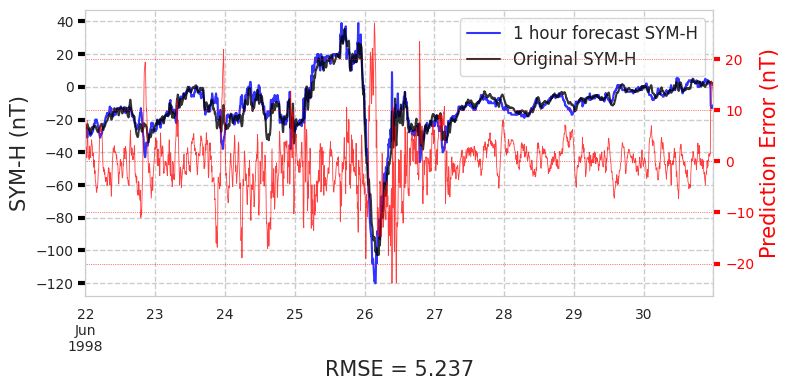

Plot for storm 27


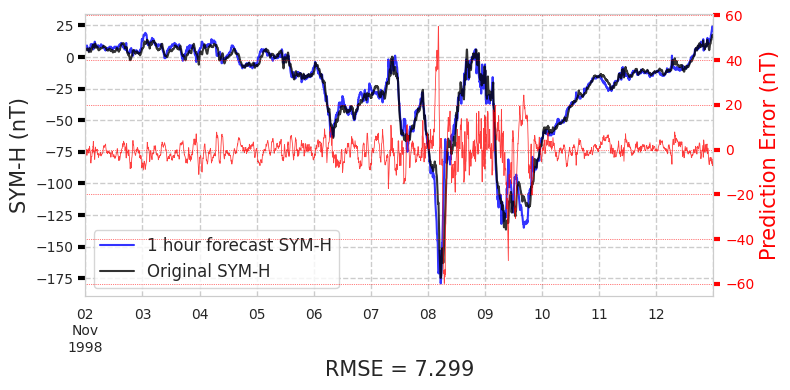

Plot for storm 28


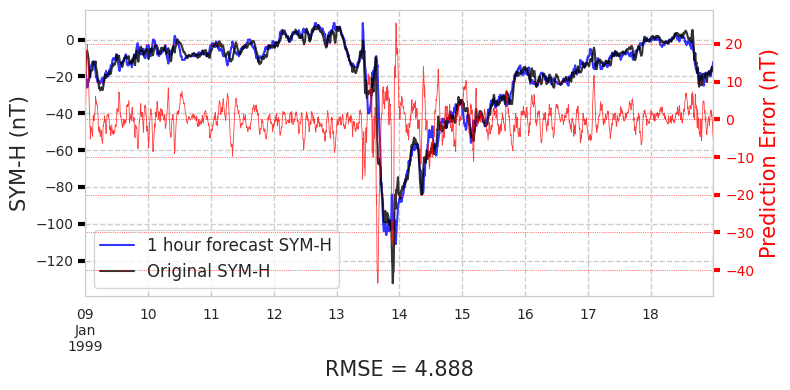

Plot for storm 29


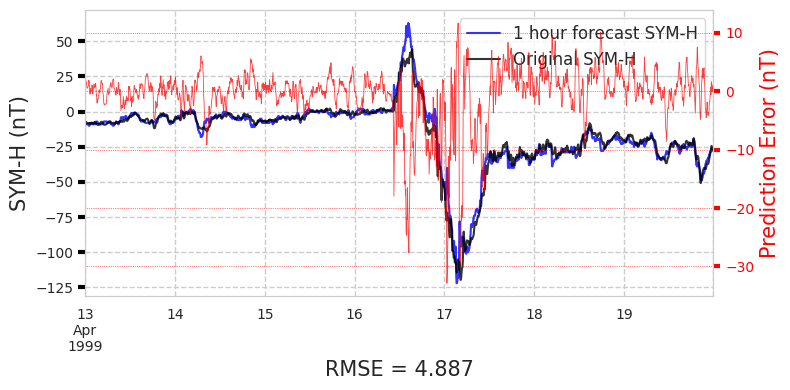

Plot for storm 30


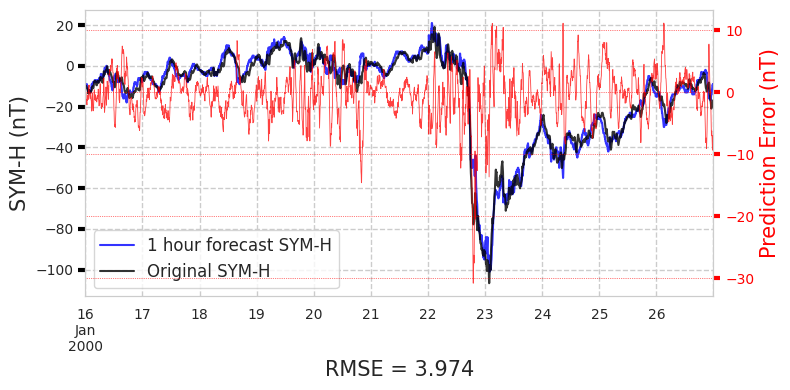

Plot for storm 31


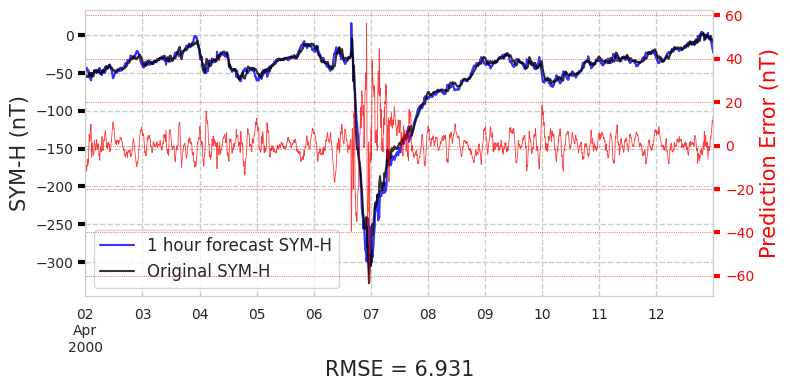

Plot for storm 32


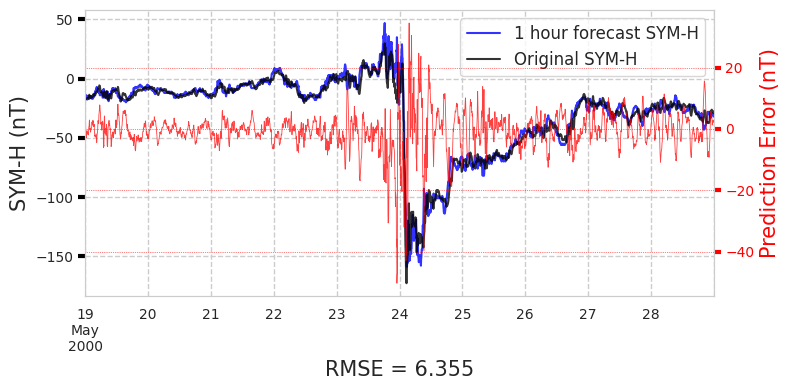

Plot for storm 33


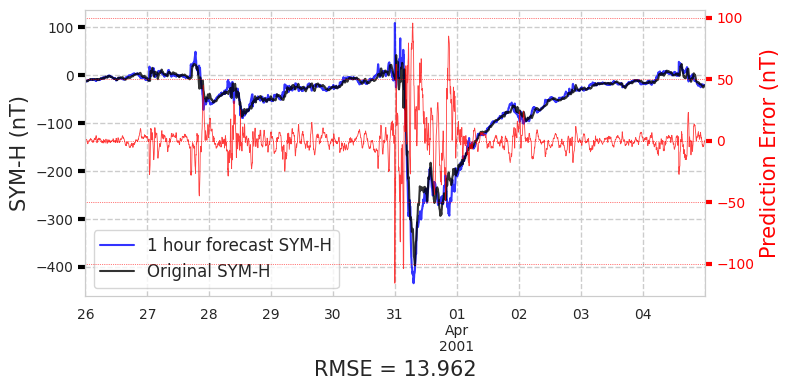

Plot for storm 34


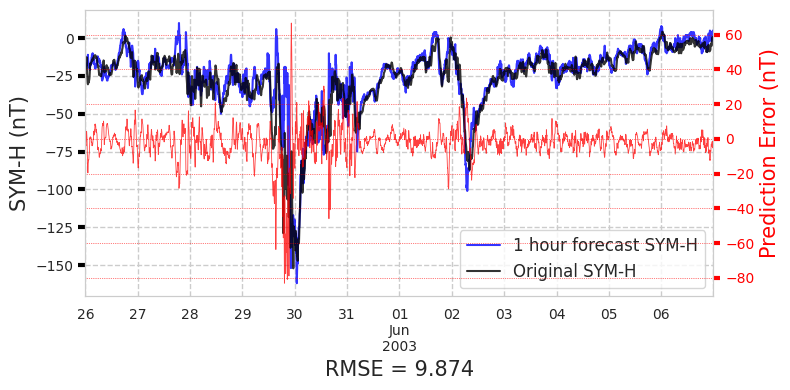

Plot for storm 35


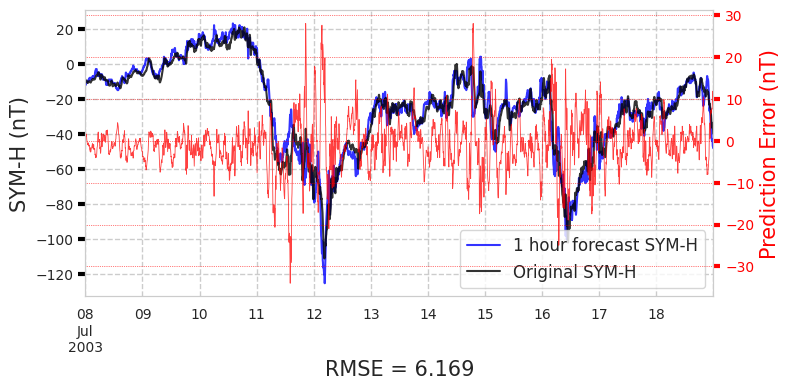

Plot for storm 36


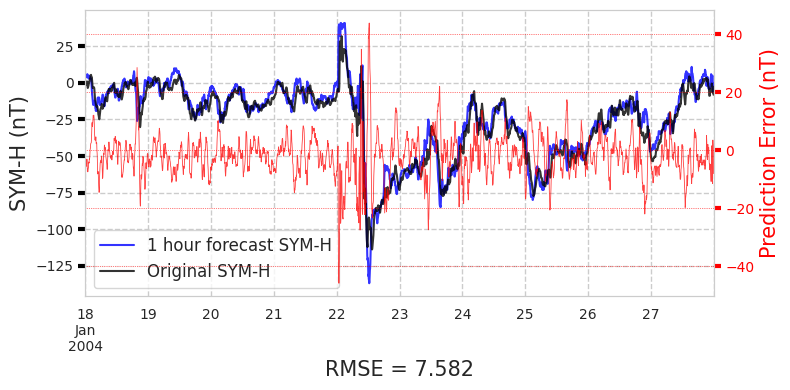

Plot for storm 37


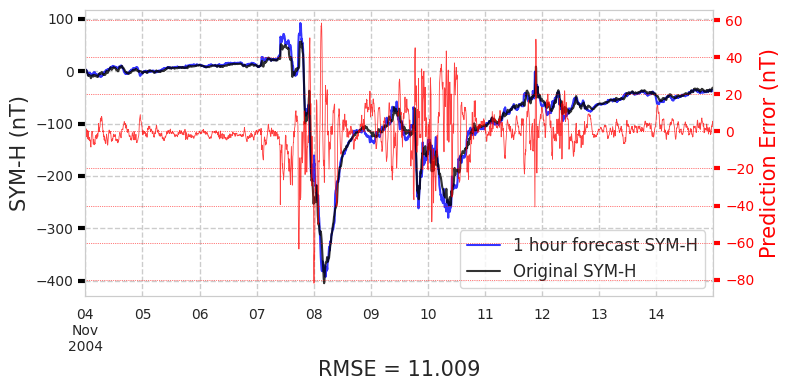

Plot for storm 38


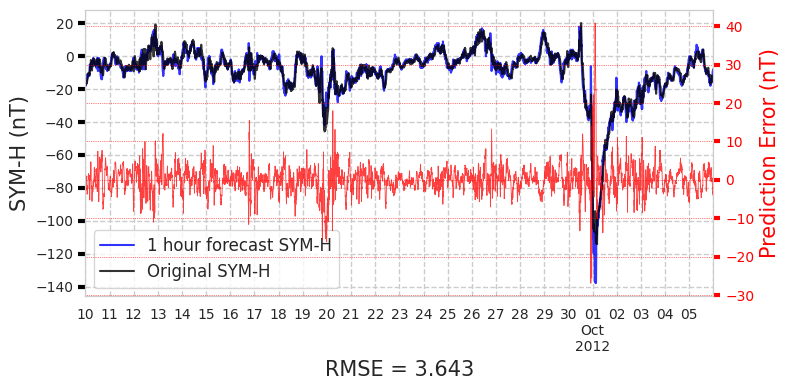

Plot for storm 39


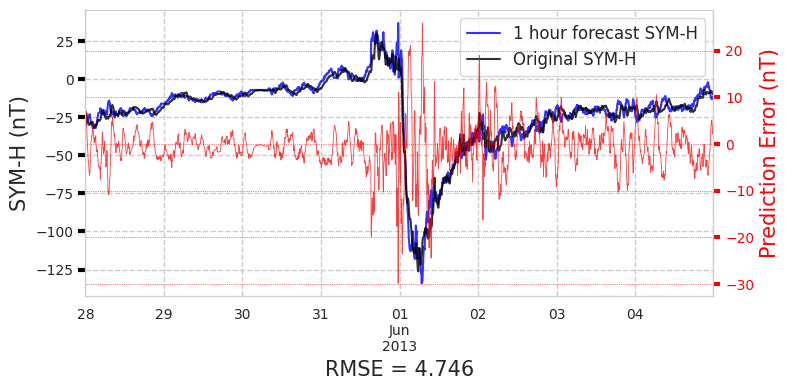

Plot for storm 40


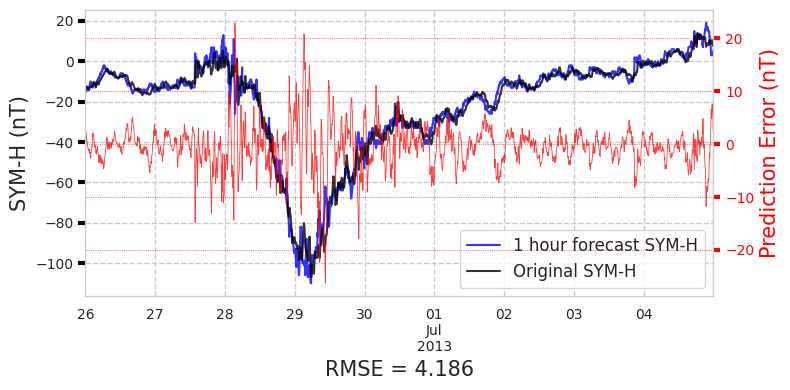

Plot for storm 41


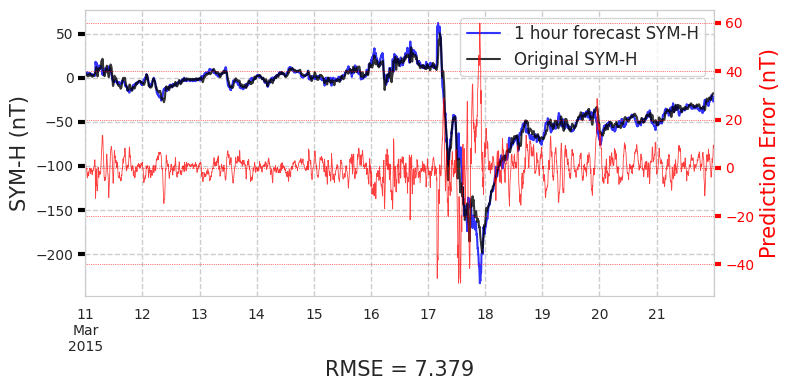

Plot for storm 42


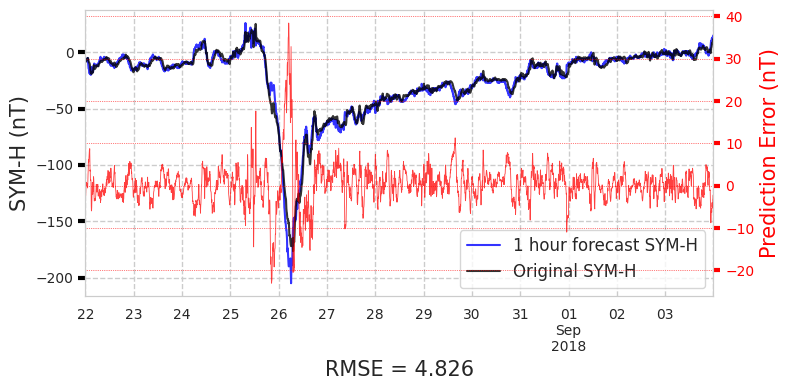

Plot for storm 26


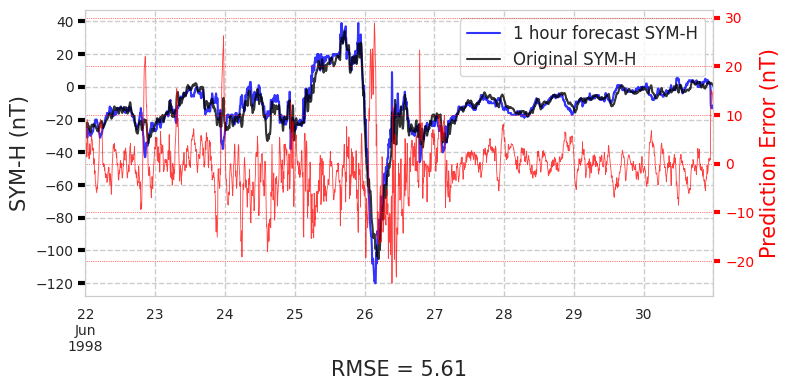

Plot for storm 27


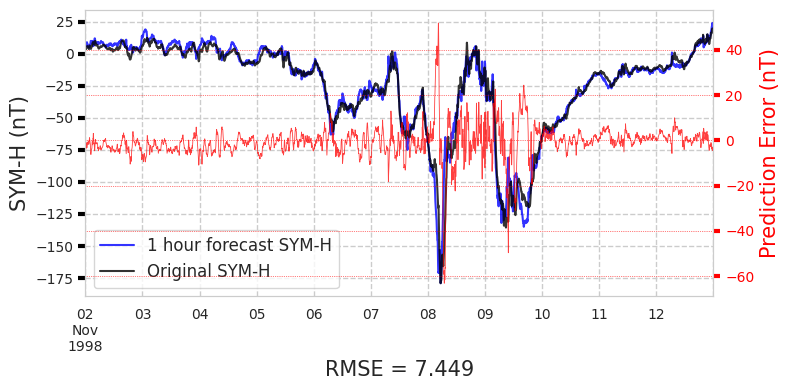

Plot for storm 28


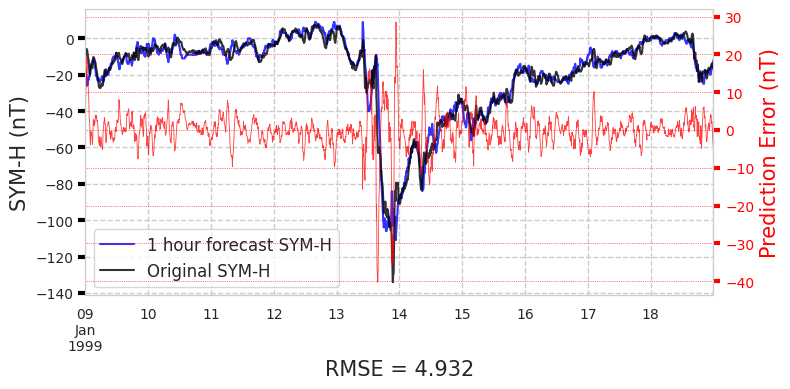

Plot for storm 29


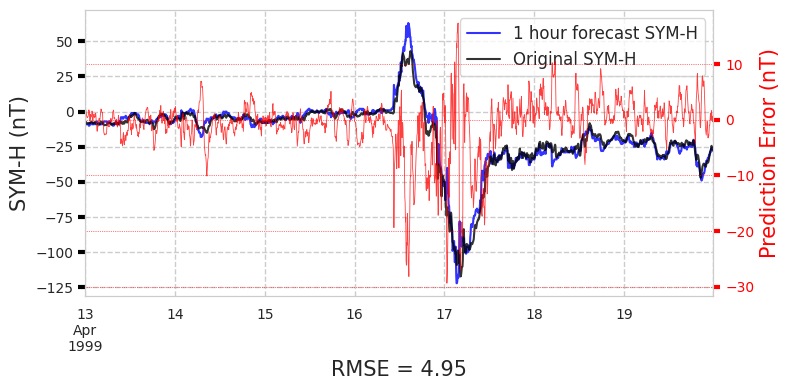

Plot for storm 30


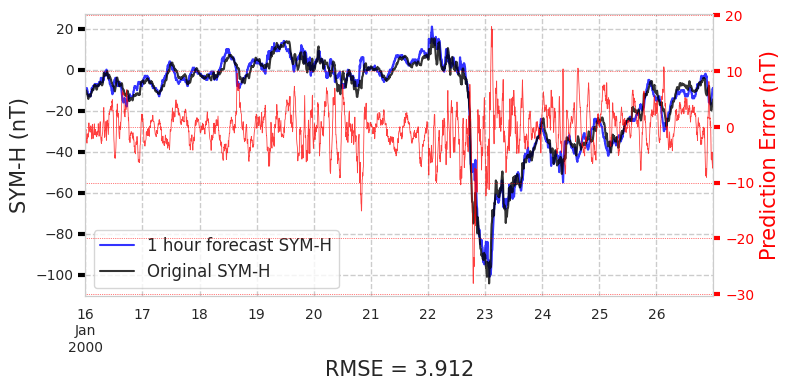

Plot for storm 31


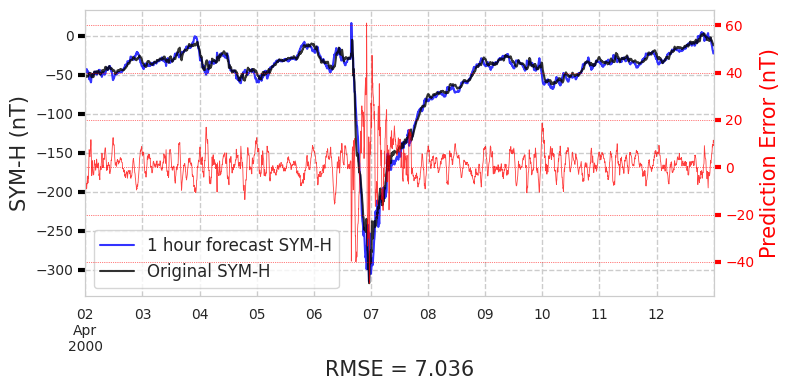

Plot for storm 32


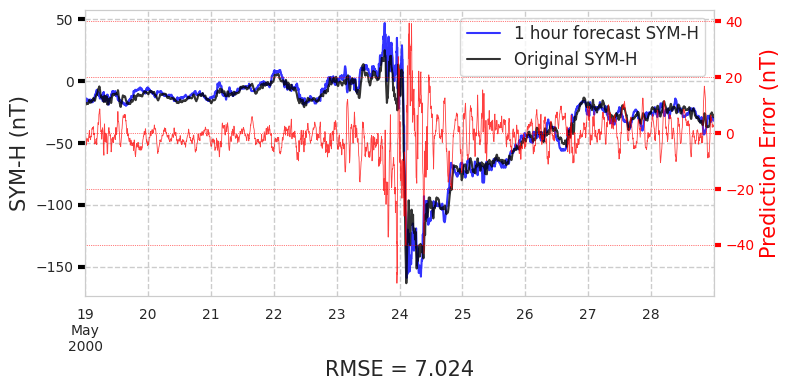

Plot for storm 33


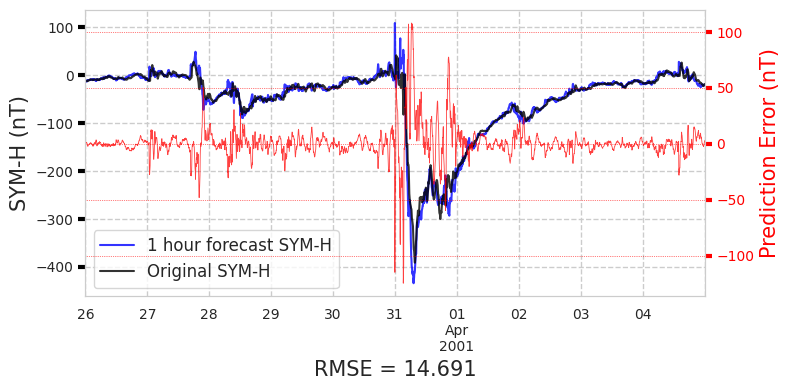

Plot for storm 34


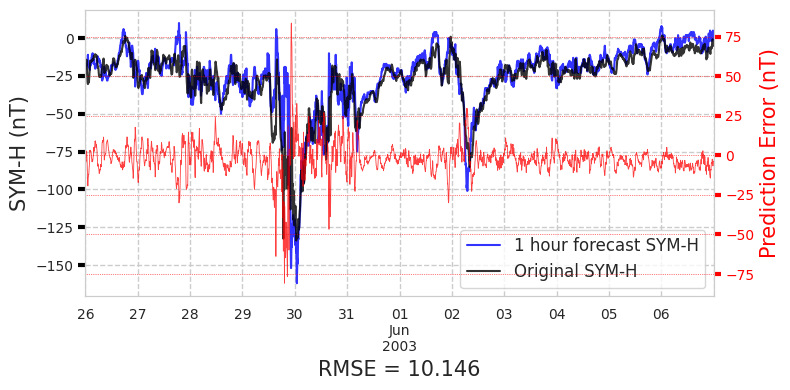

Plot for storm 35


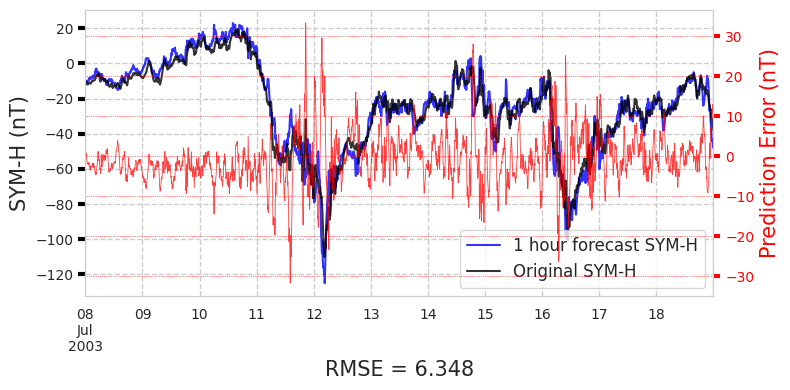

Plot for storm 36


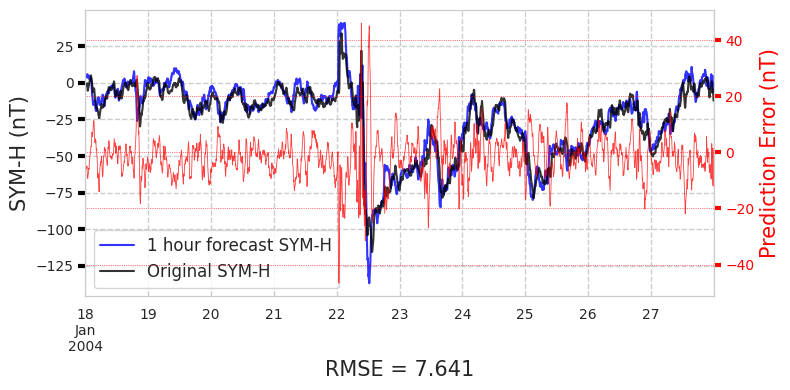

Plot for storm 37


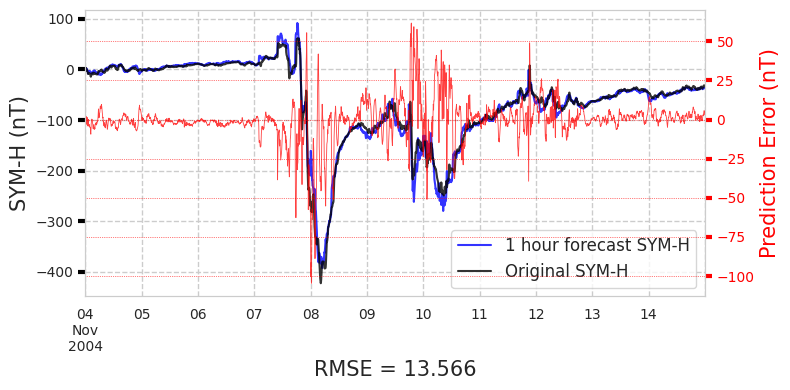

Plot for storm 38


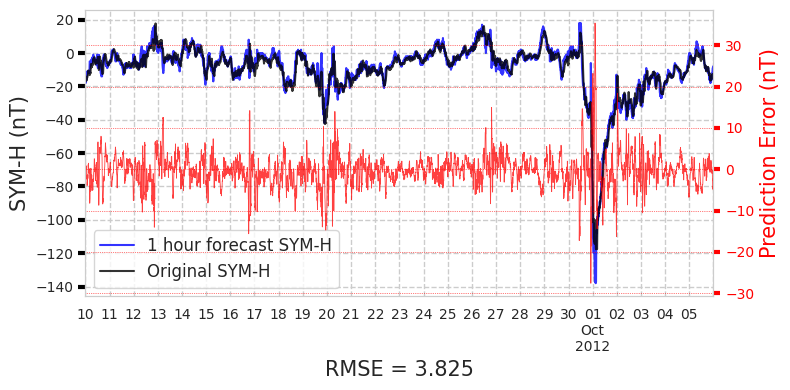

Plot for storm 39


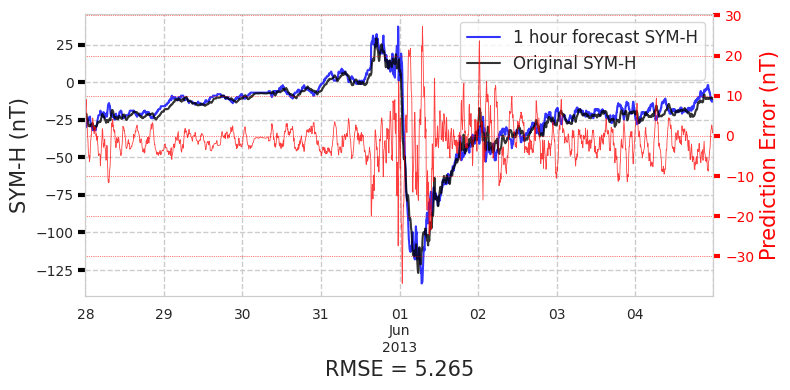

Plot for storm 40


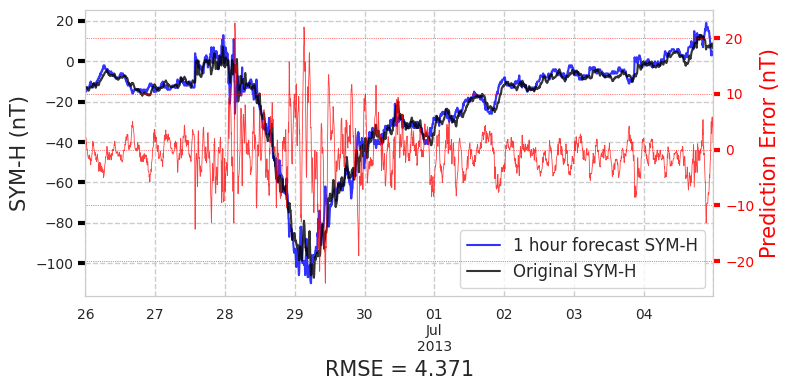

Plot for storm 41


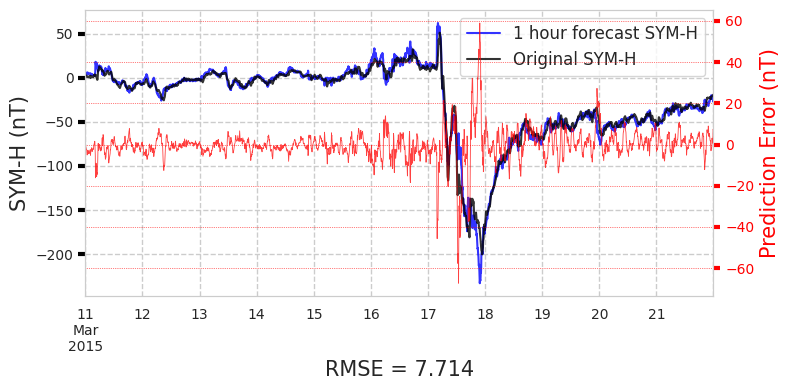

Plot for storm 42


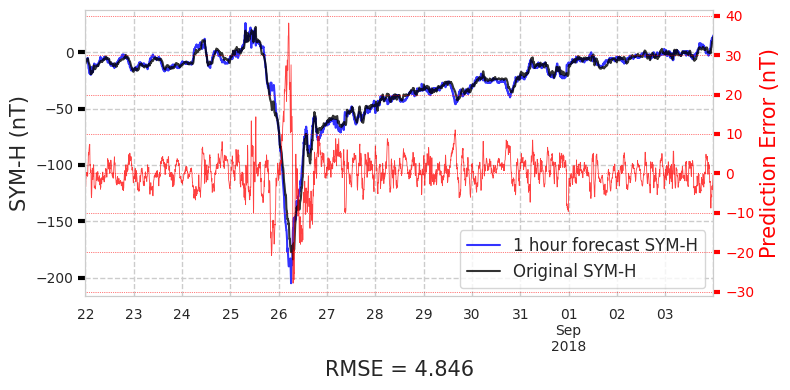

Plot for storm 26


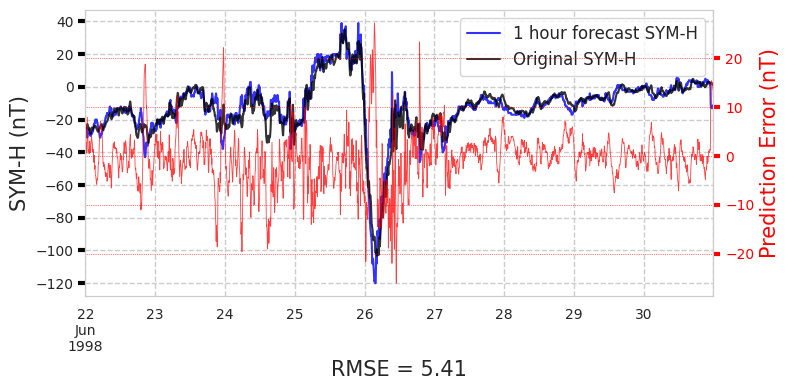

Plot for storm 27


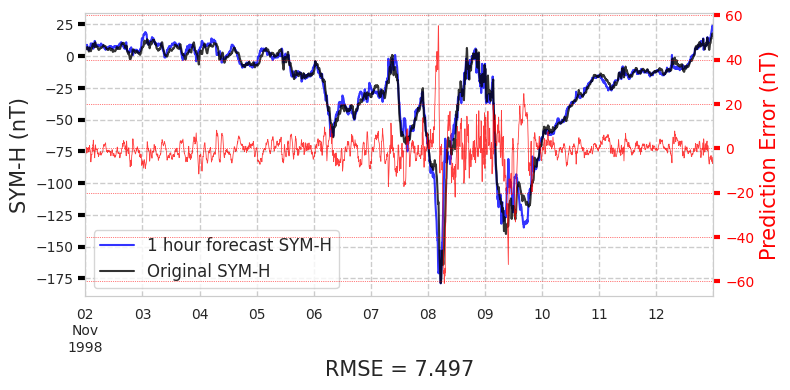

Plot for storm 28


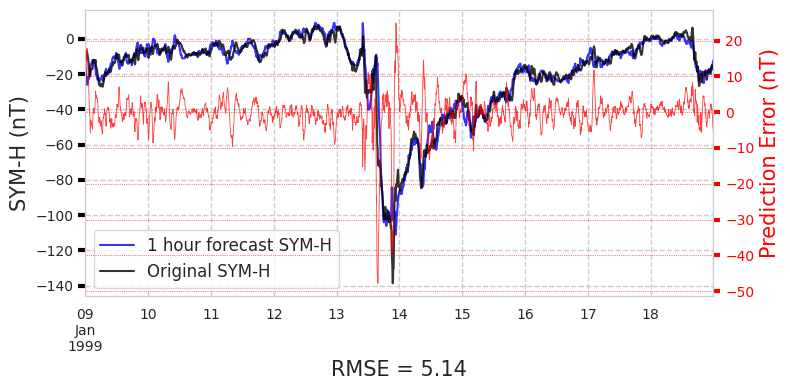

Plot for storm 29


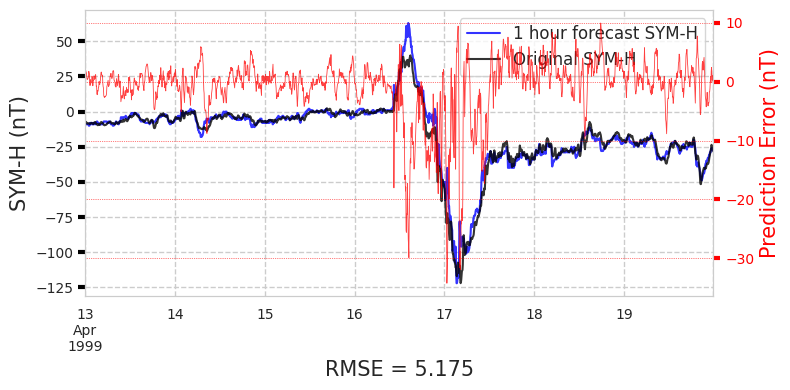

Plot for storm 30


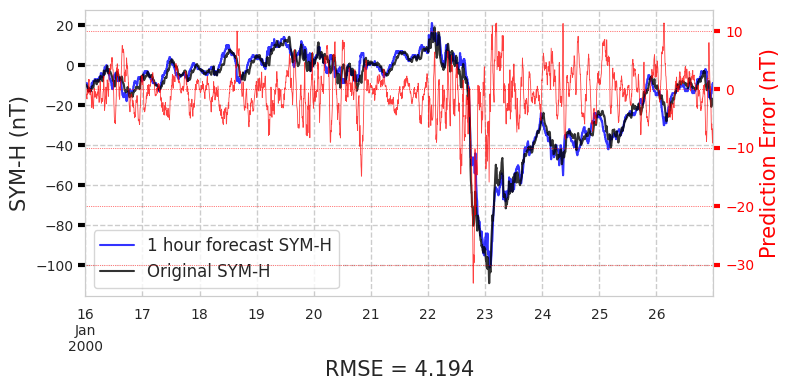

Plot for storm 31


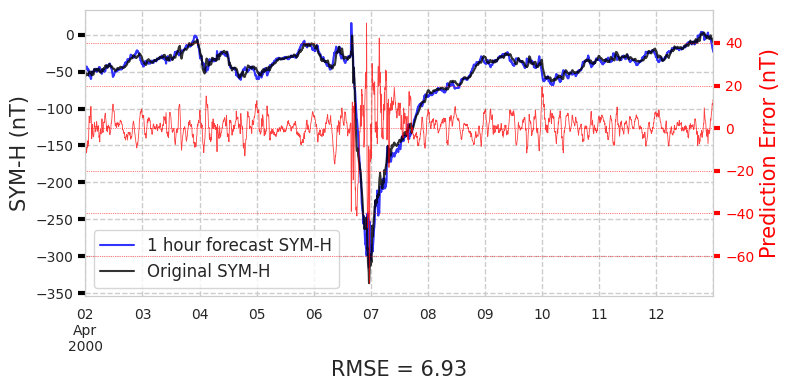

Plot for storm 32


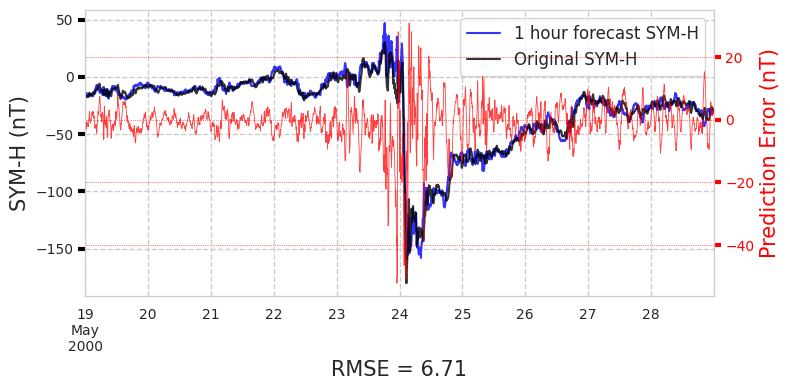

Plot for storm 33


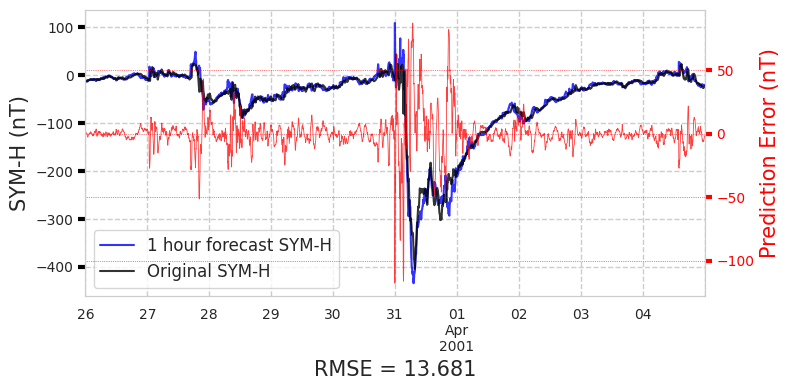

Plot for storm 34


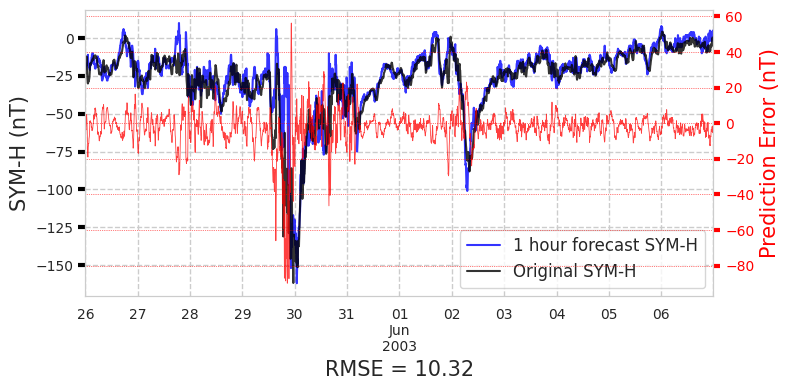

Plot for storm 35


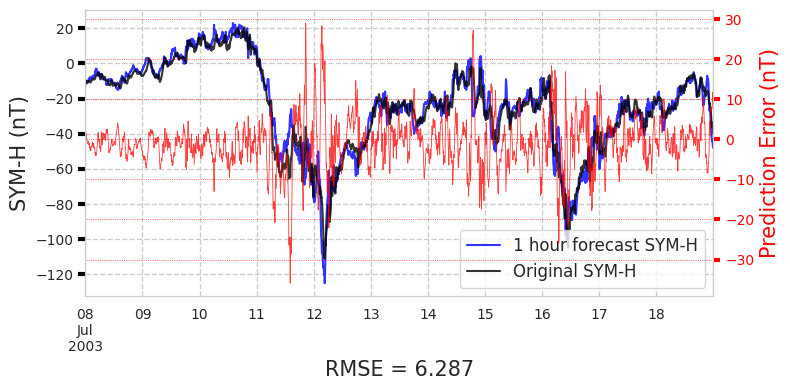

Plot for storm 36


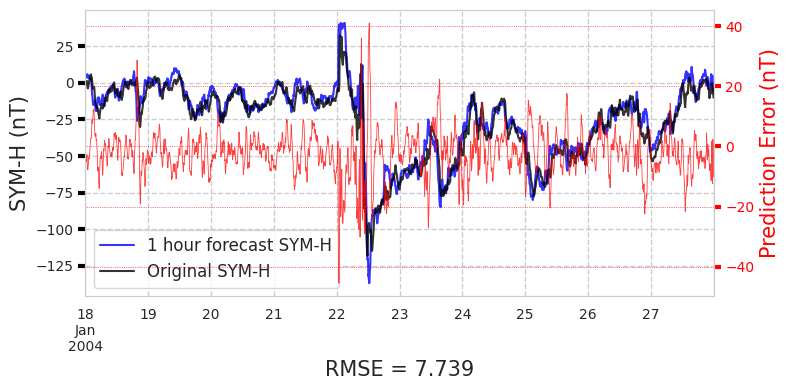

Plot for storm 37


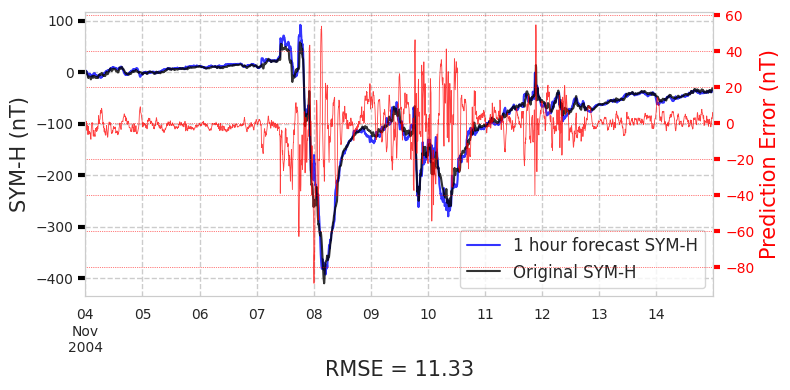

Plot for storm 38


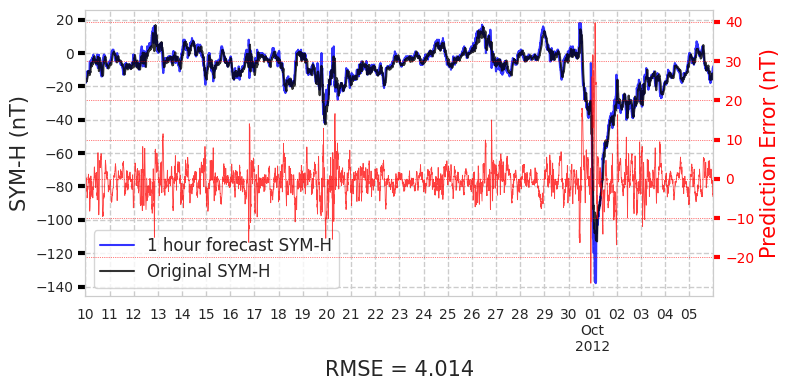

Plot for storm 39


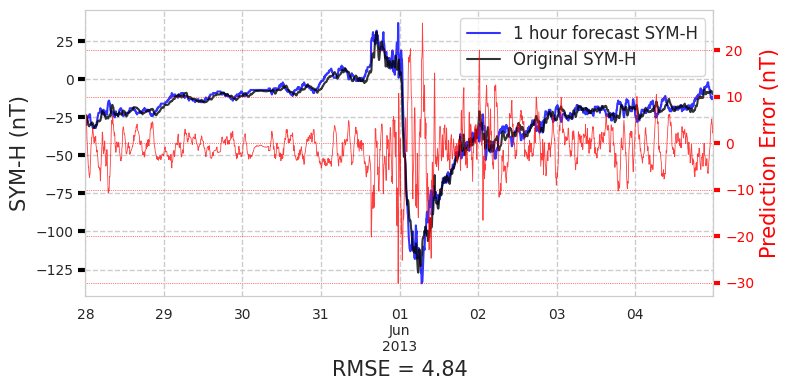

Plot for storm 40


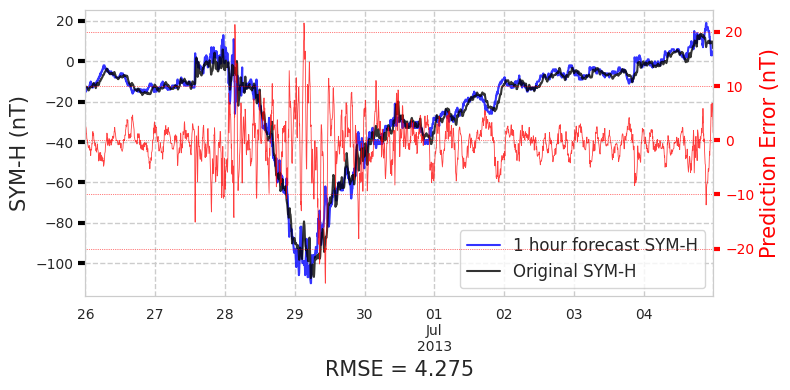

Plot for storm 41


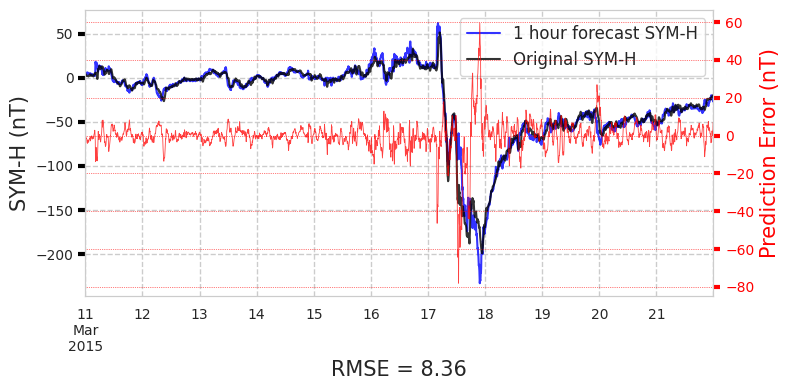

Plot for storm 42


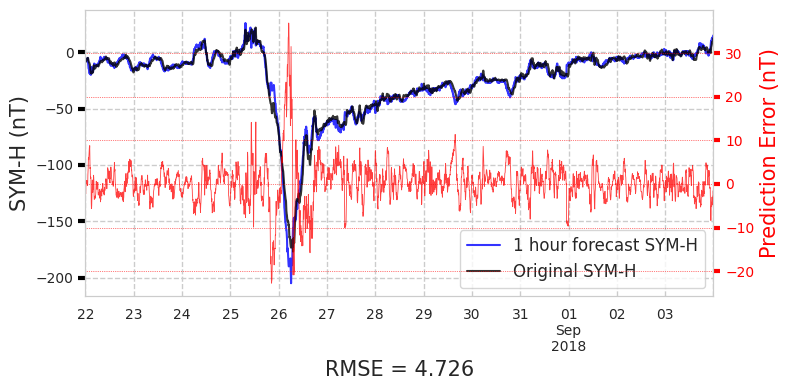

Plot for storm 26


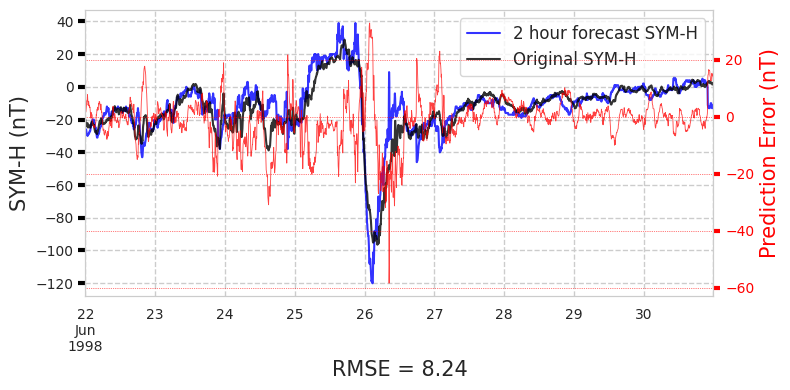

Plot for storm 27


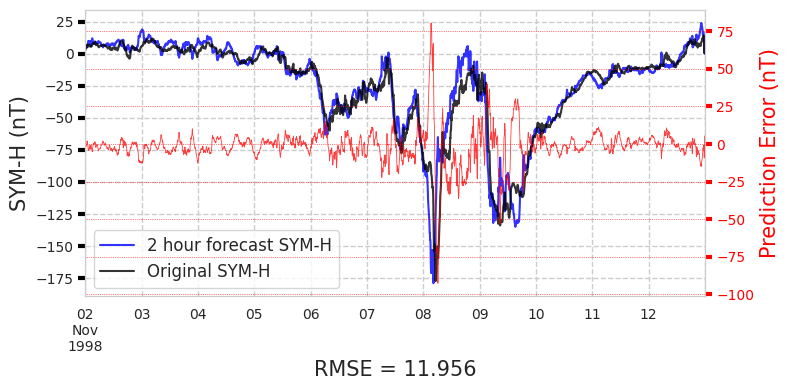

Plot for storm 28


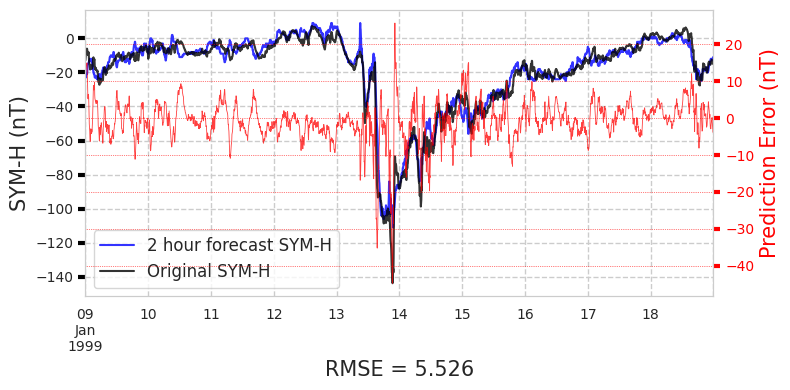

Plot for storm 29


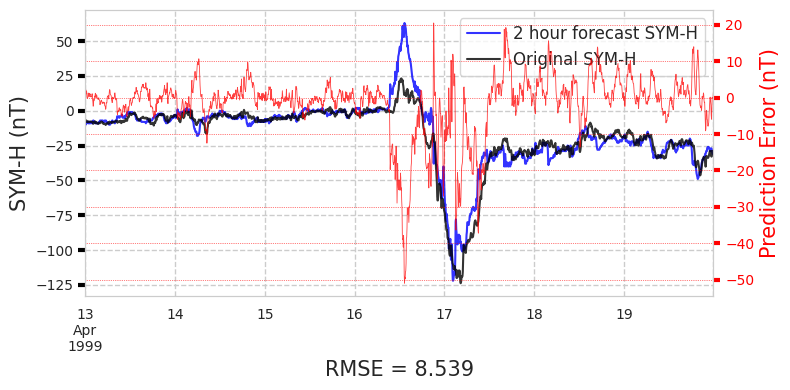

Plot for storm 30


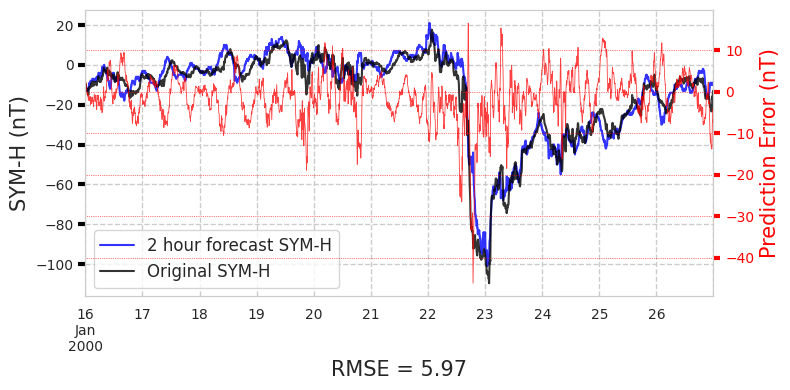

Plot for storm 31


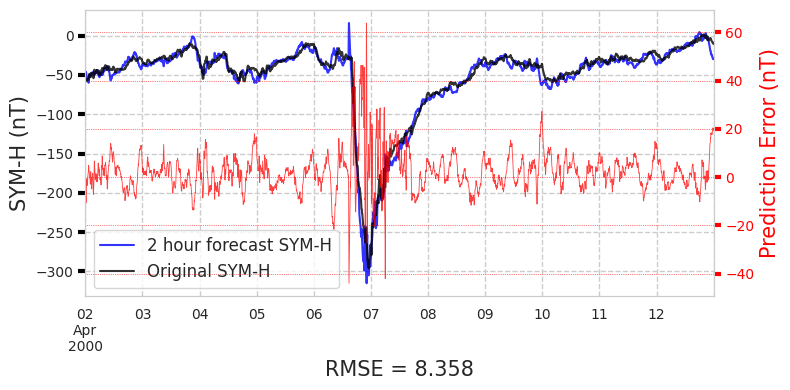

Plot for storm 32


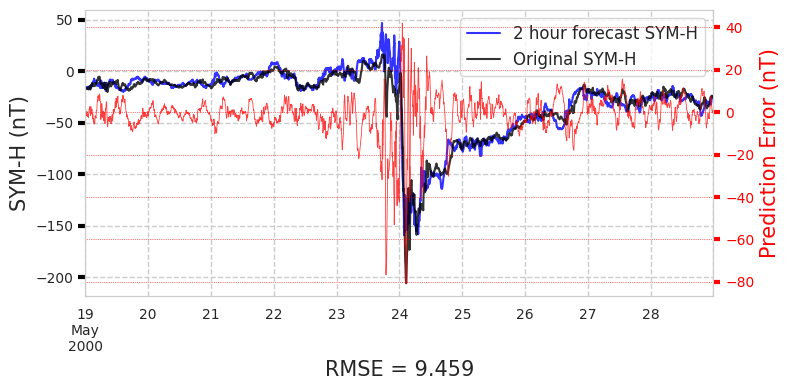

Plot for storm 33


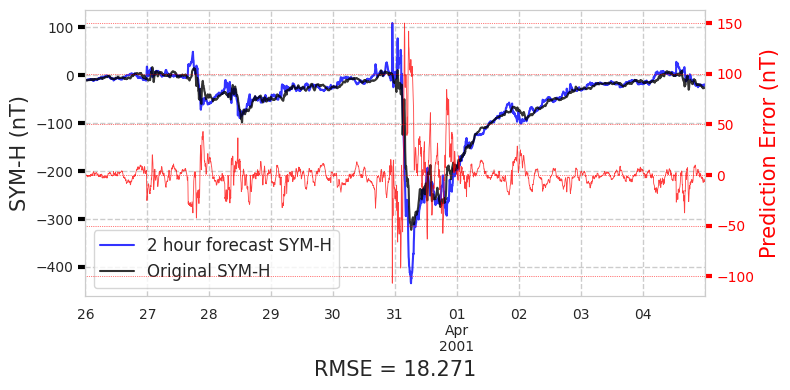

Plot for storm 34


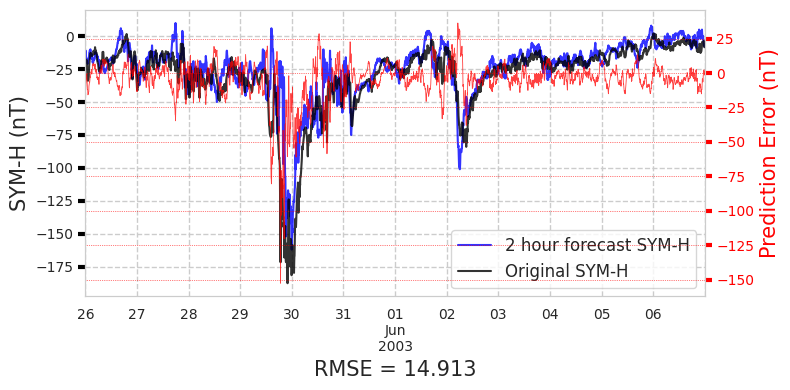

Plot for storm 35


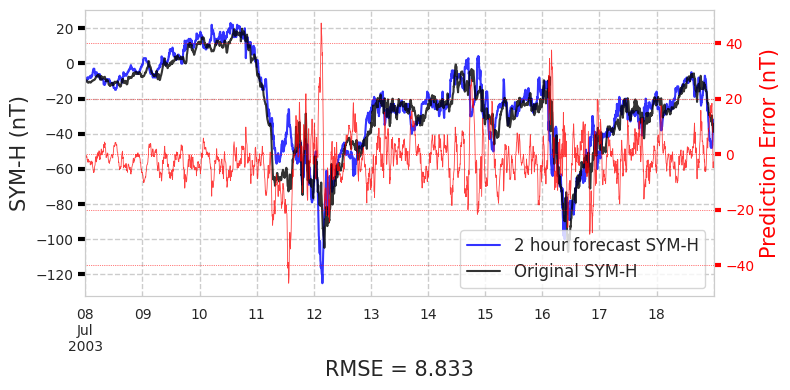

Plot for storm 36


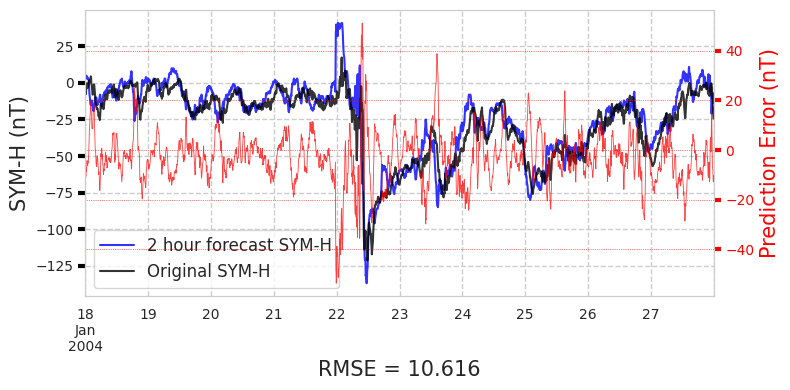

Plot for storm 37


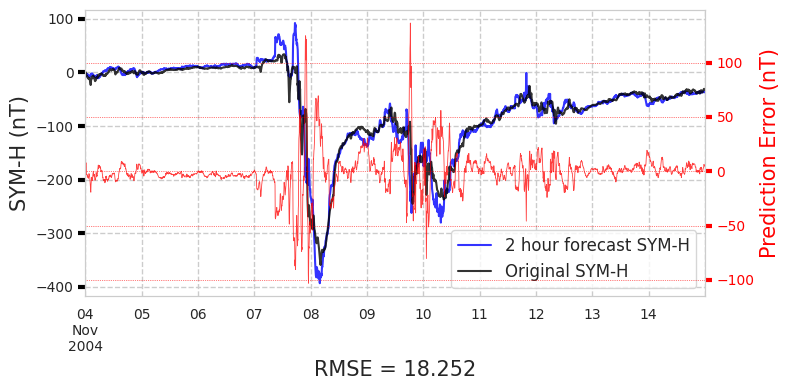

Plot for storm 38


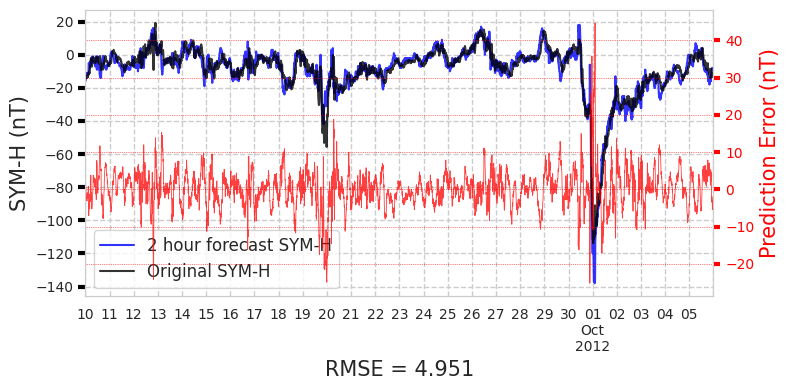

Plot for storm 39


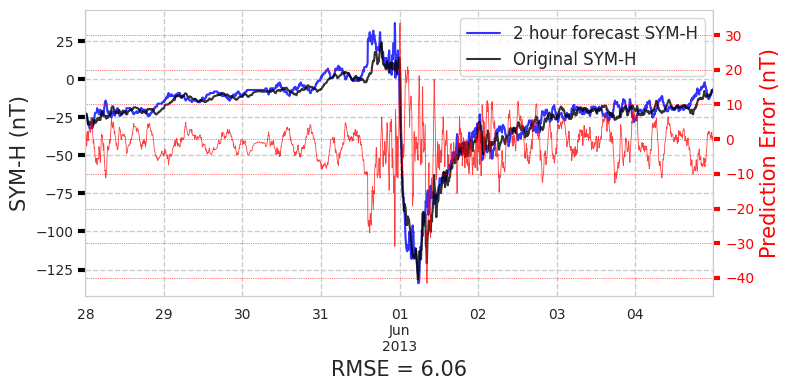

Plot for storm 40


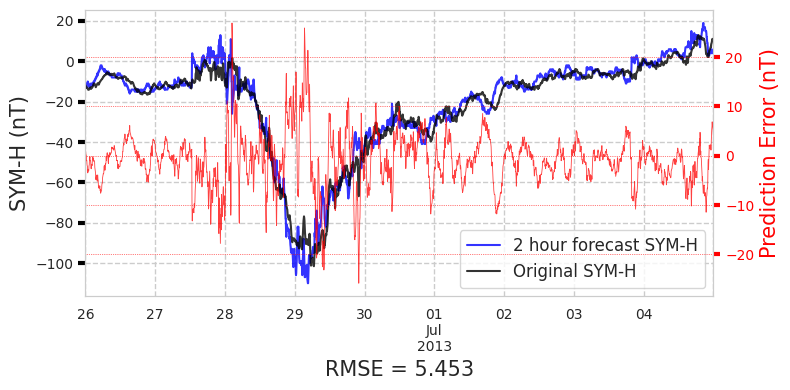

Plot for storm 41


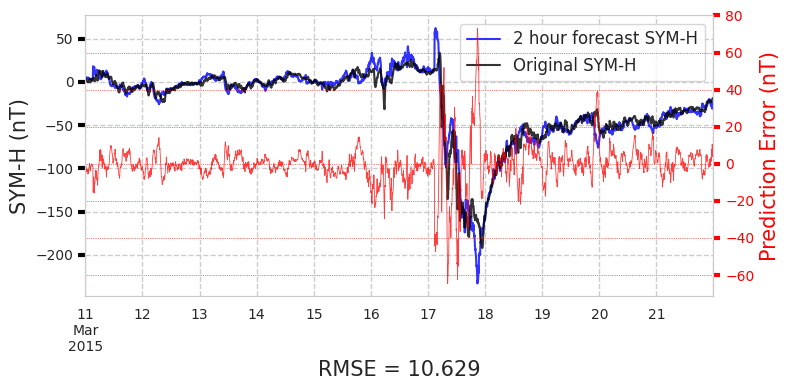

Plot for storm 42


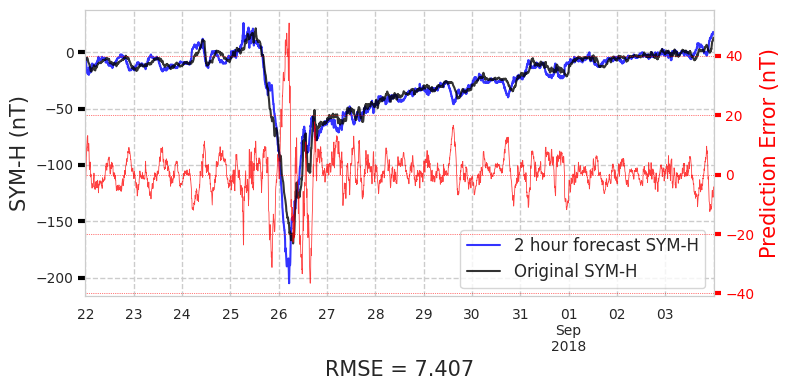

Plot for storm 26


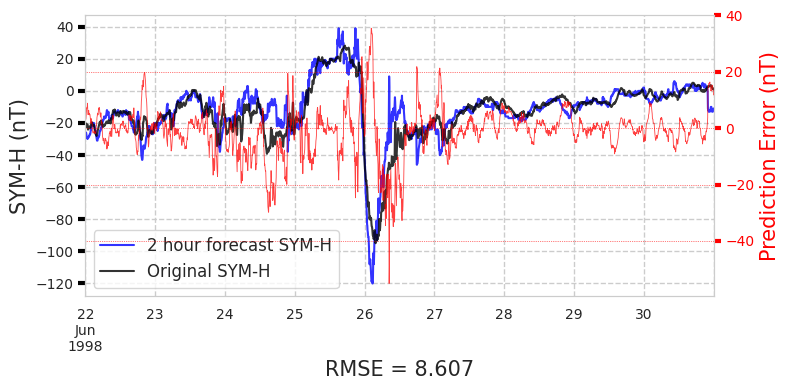

Plot for storm 27


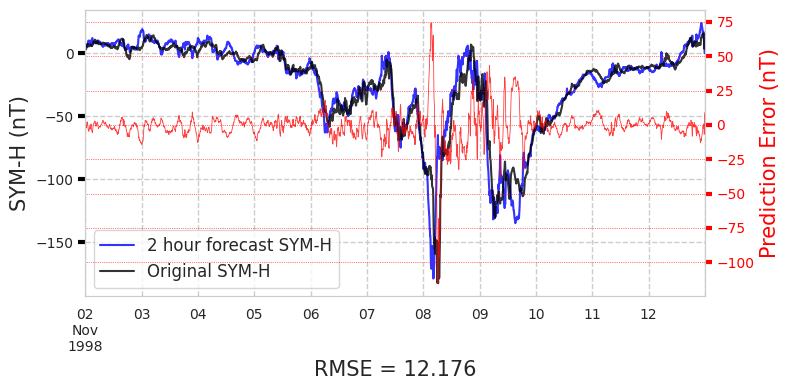

Plot for storm 28


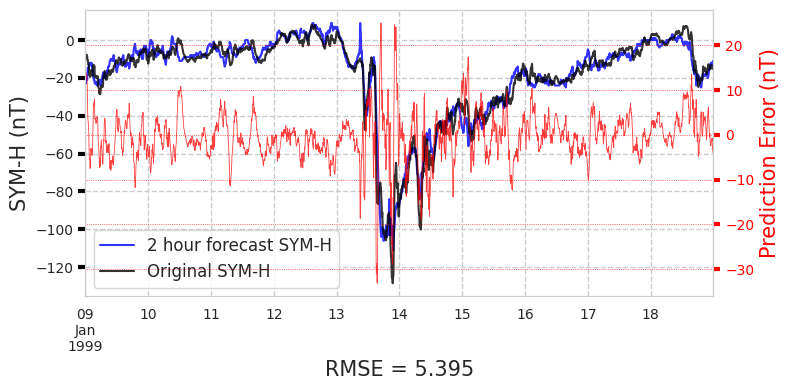

Plot for storm 29


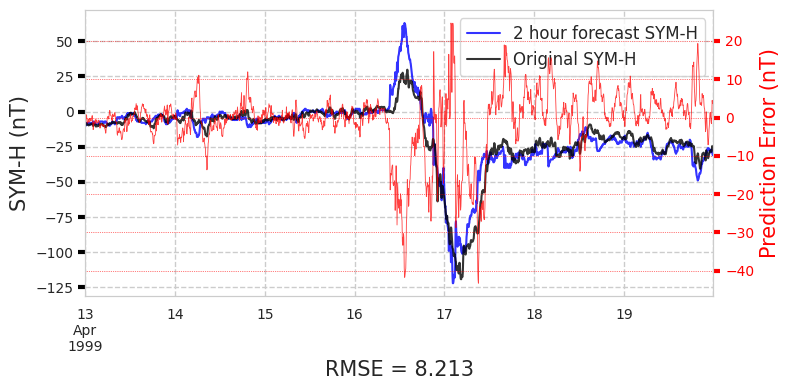

Plot for storm 30


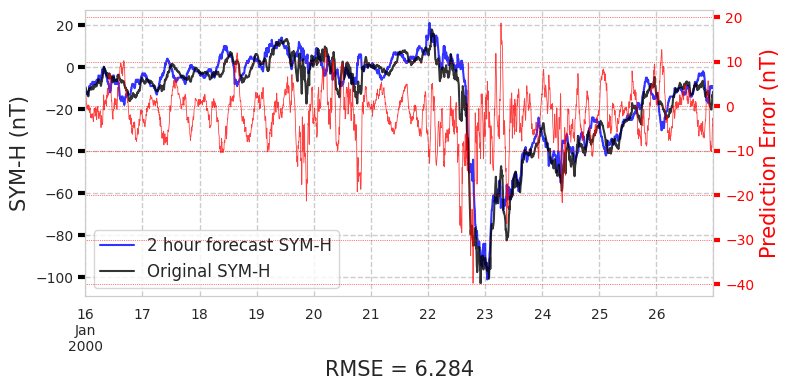

Plot for storm 31


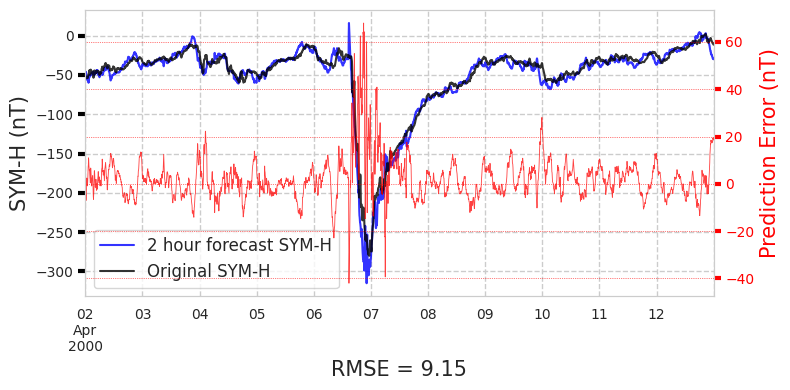

Plot for storm 32


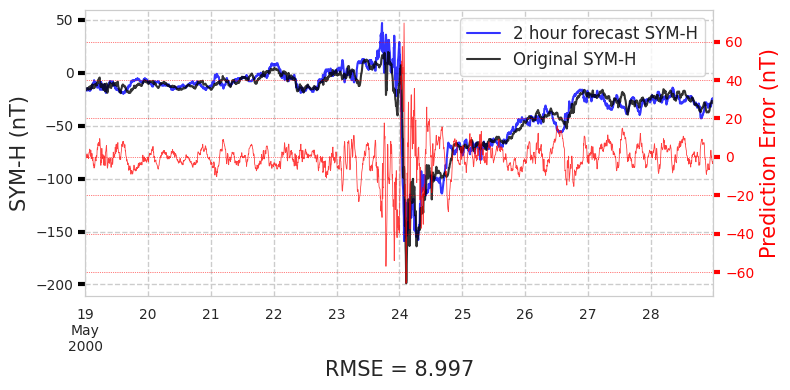

Plot for storm 33


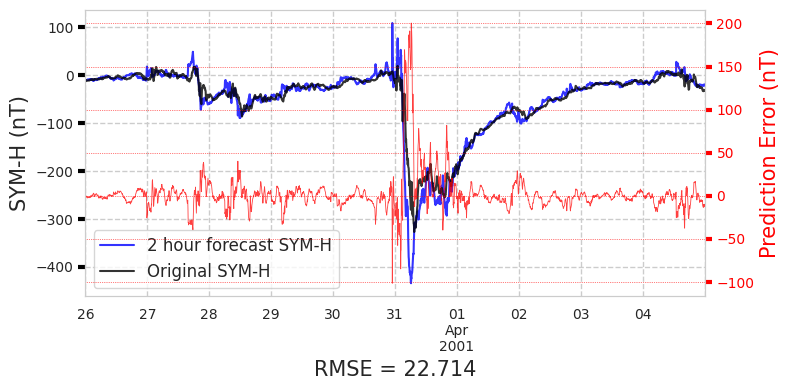

Plot for storm 34


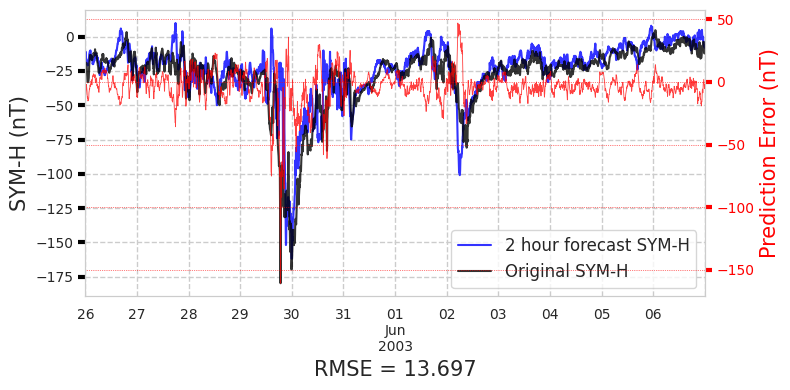

Plot for storm 35


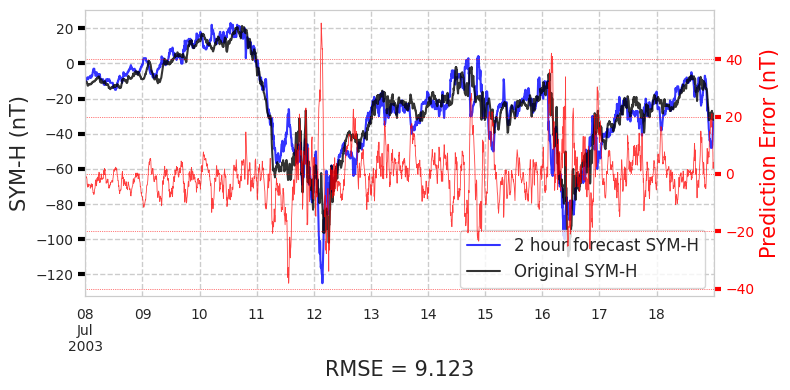

Plot for storm 36


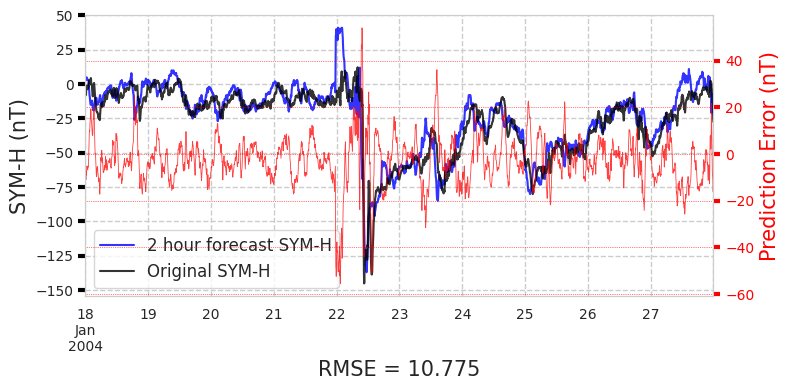

Plot for storm 37


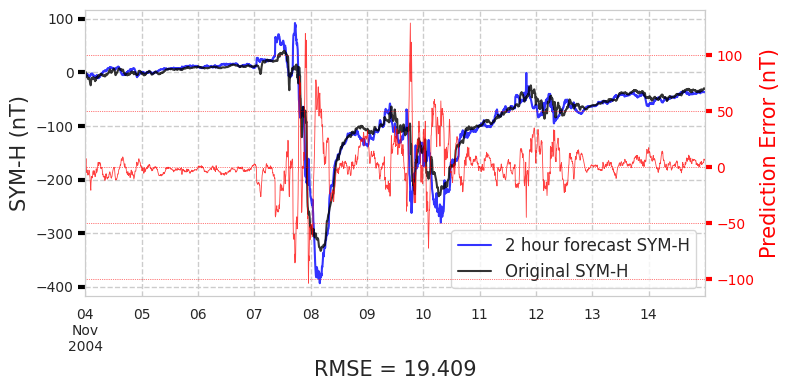

Plot for storm 38


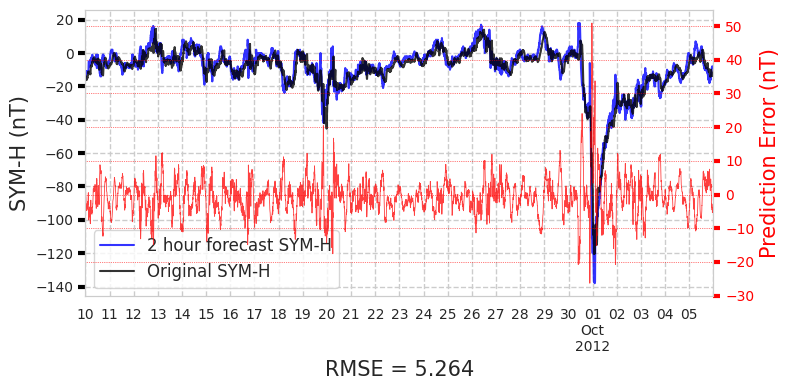

Plot for storm 39


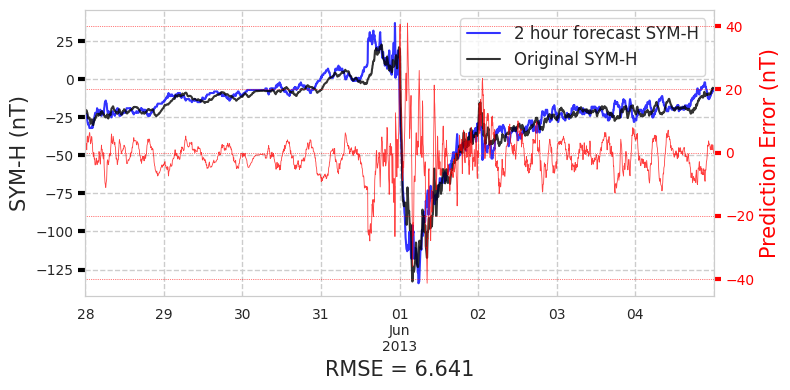

Plot for storm 40


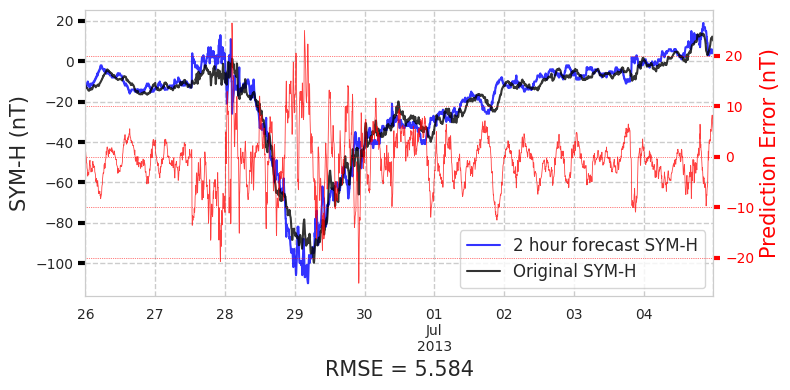

Plot for storm 41


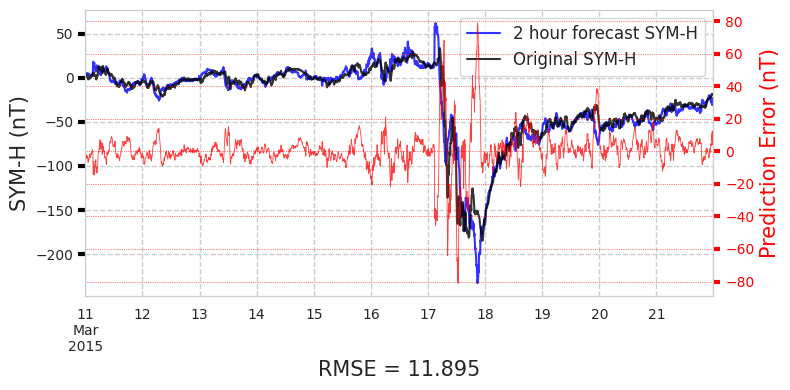

Plot for storm 42


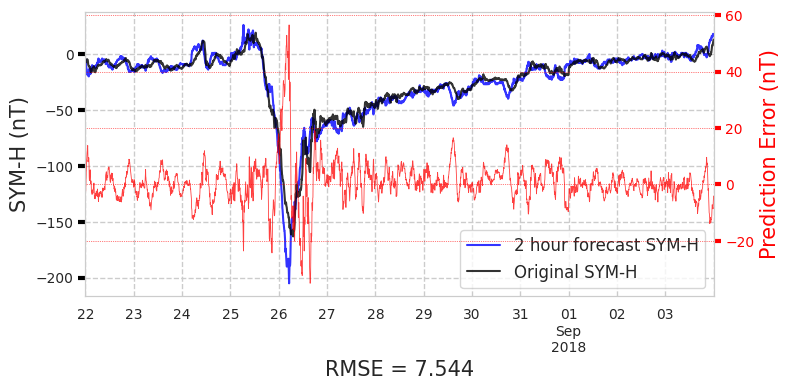

Plot for storm 26


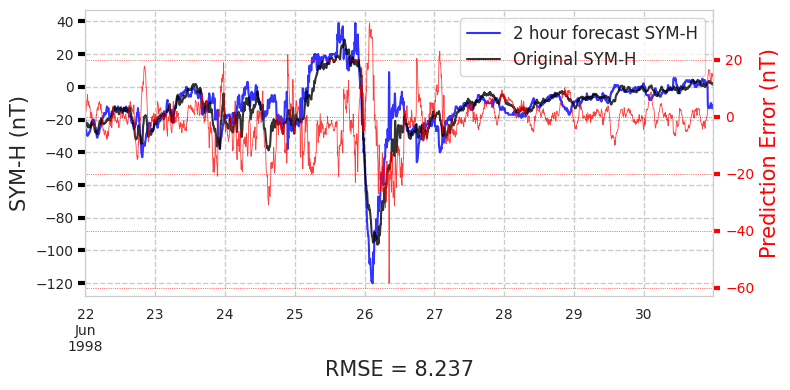

Plot for storm 27


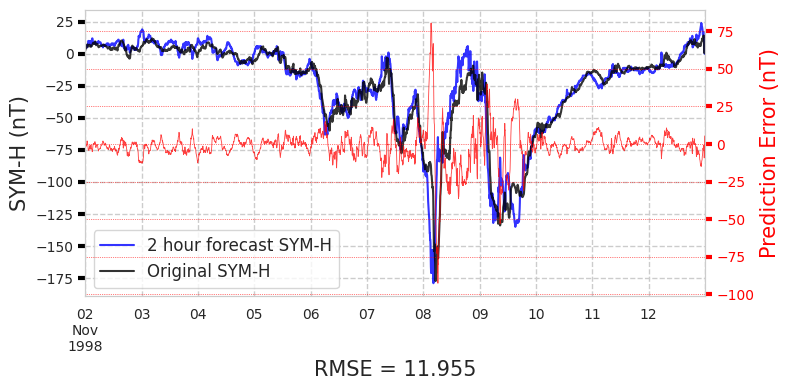

Plot for storm 28


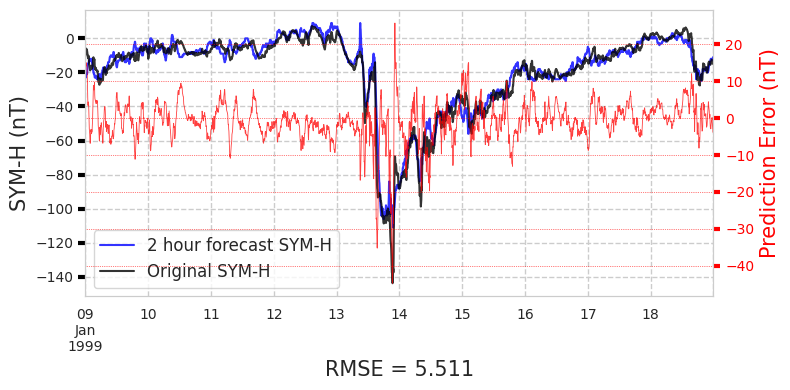

Plot for storm 29


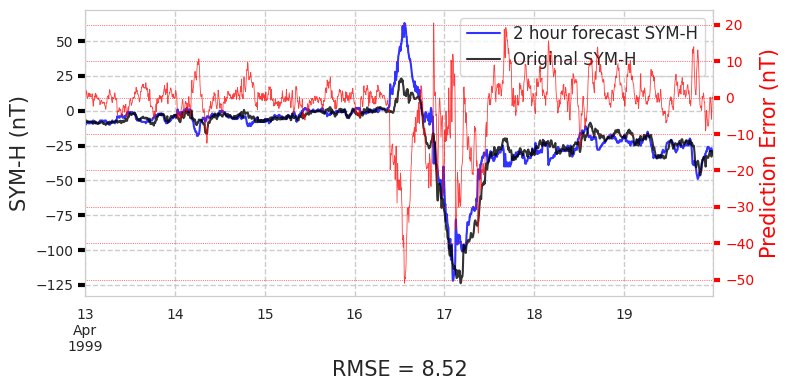

Plot for storm 30


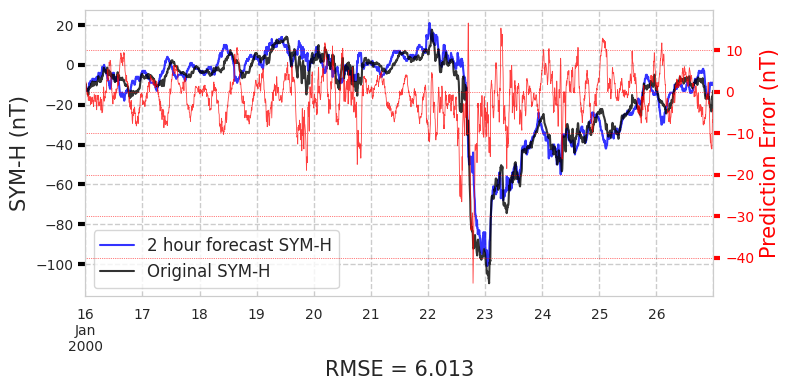

Plot for storm 31


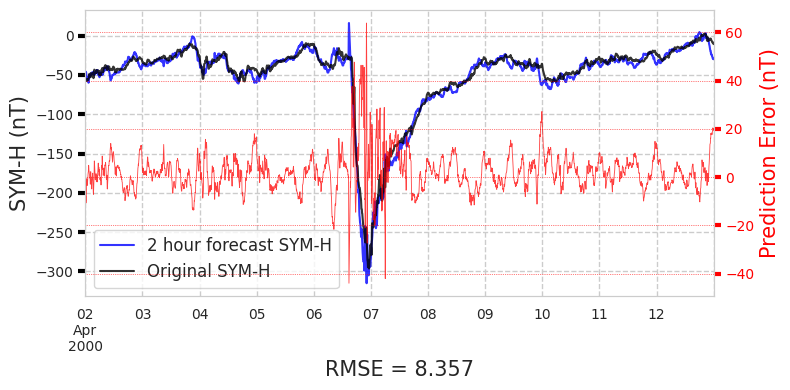

Plot for storm 32


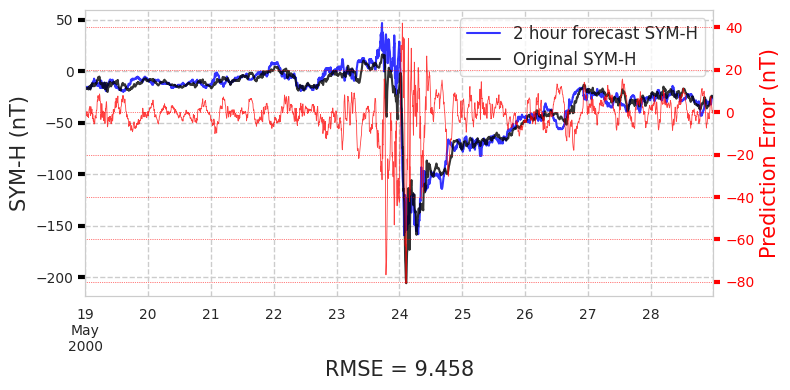

Plot for storm 33


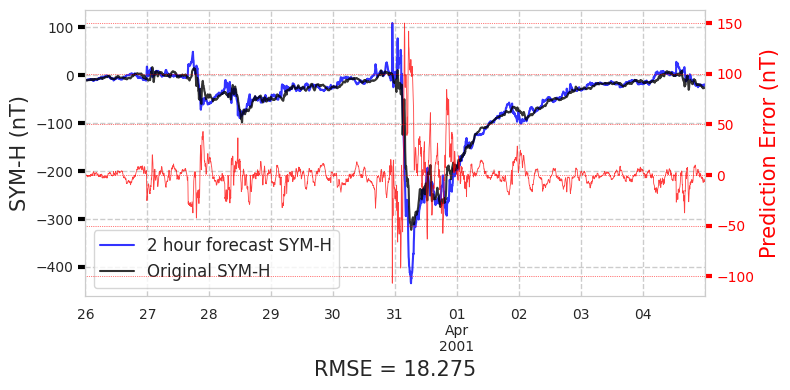

Plot for storm 34


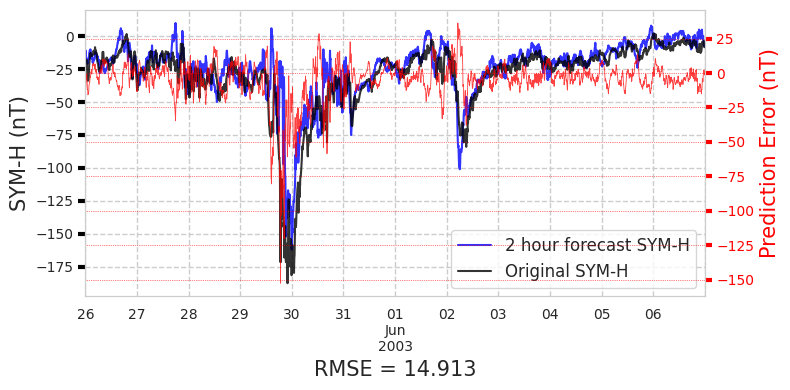

Plot for storm 35


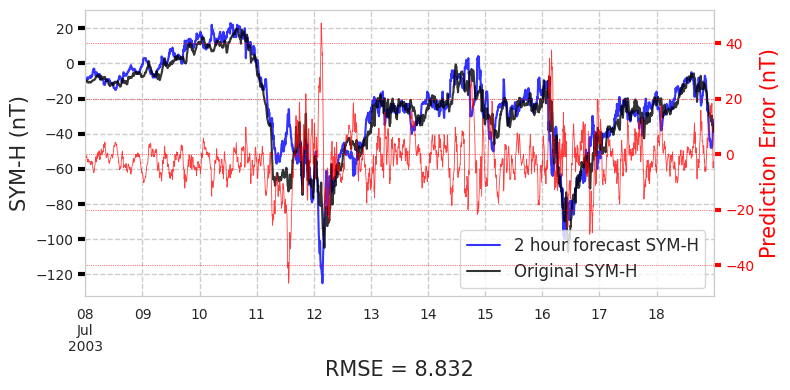

Plot for storm 36


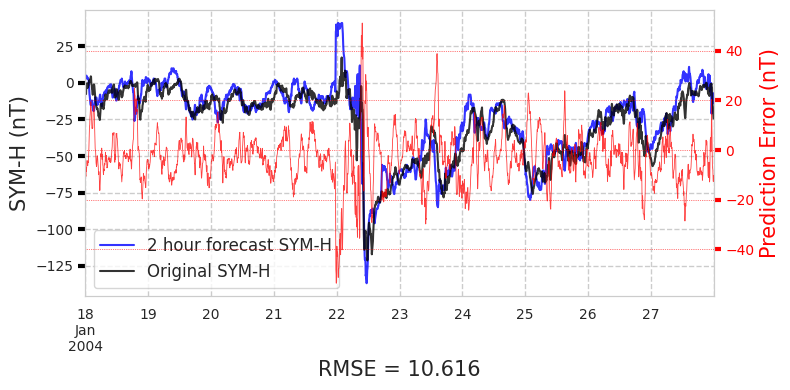

Plot for storm 37


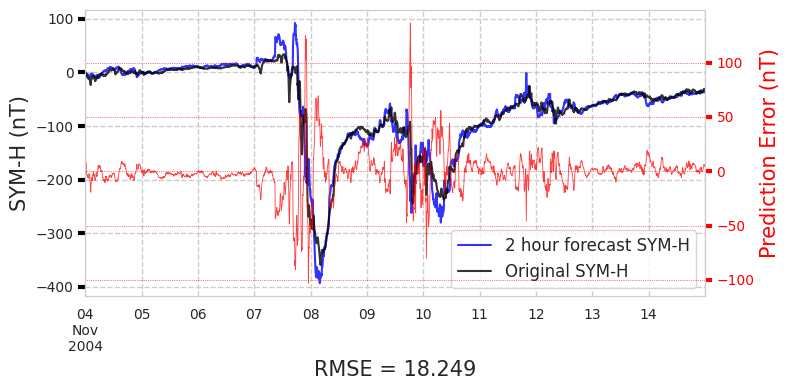

Plot for storm 38


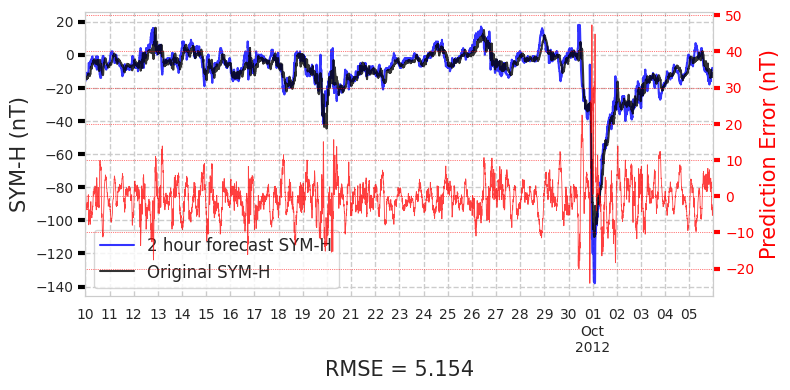

Plot for storm 39


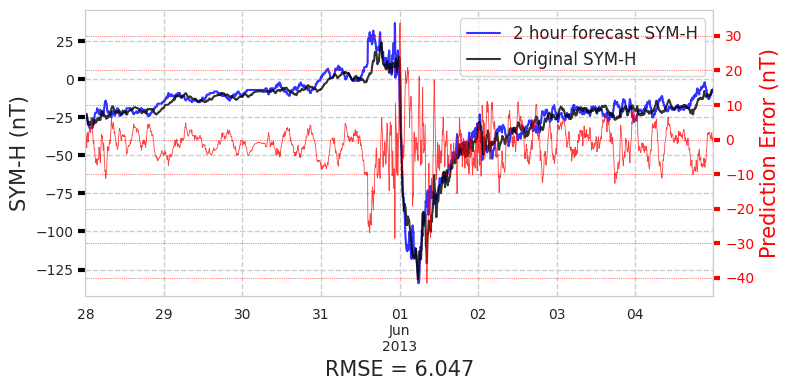

Plot for storm 40


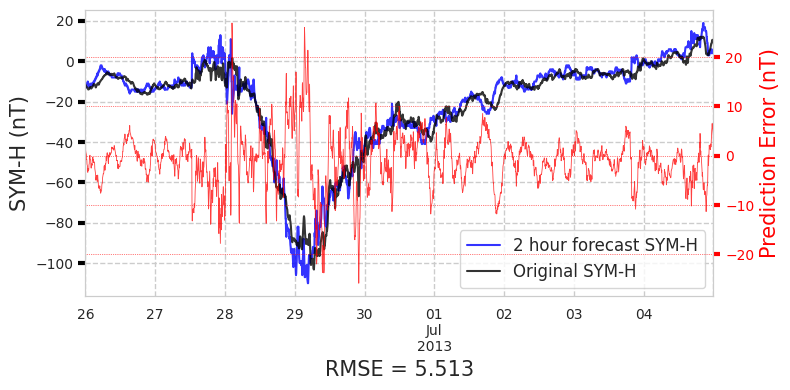

Plot for storm 41


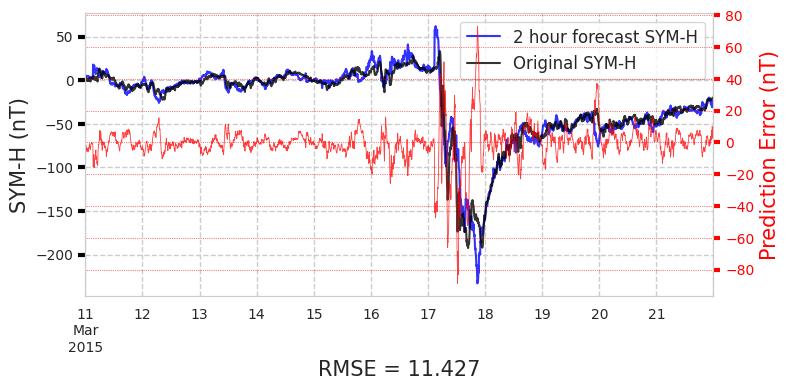

Plot for storm 42


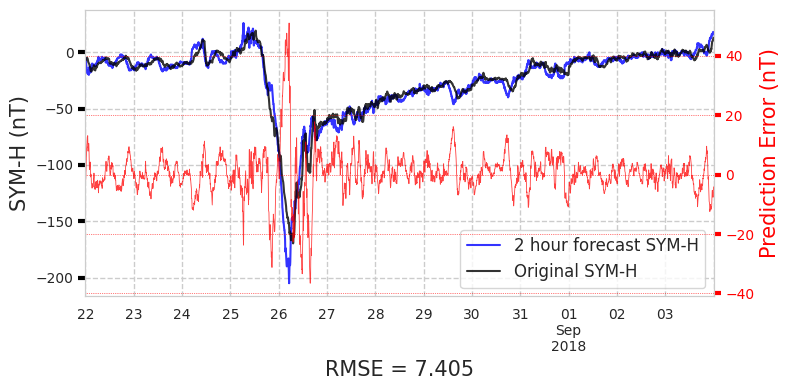

In [15]:
column_pairs = [
    ('original_SYM_H-t60', 'predicted_SYM-H_t60_swics', "1 hour forecast SYM-H", '1h_swics', 'Proposed model trained with SWEPAM and SWICS'),
    ('original_SYM_H-t60', 'predicted_SYM-H_t60_no_swics', "1 hour forecast SYM-H", '1h_no_swics', 'Proposed model trained with SWEPAM'),
    ('original_SYM_H-t60', 'predicted_SYM_H-t60_swics_model_on_no_swics', "1 hour forecast SYM-H", '1h_swics_model_on_no_swics', 'Proposed model trained with SWEPAM and SWICS, evaluated on SWEPAM'),
    ('original_SYM-H_t120', 'predicted_SYM-H_t120_swics', "2 hour forecast SYM-H", '2h_swics', 'Proposed model trained with SWEPAM and SWICS'),
    ('original_SYM-H_t120', 'predicted_SYM-H_t120_no_swics', "2 hour forecast SYM-H", '2h_no_swics', 'Proposed model trained with SWEPAM'),
    ('original_SYM-H_t120', 'predicted_SYM_H-t120_swics_model_on_no_swics', "2 hour forecast SYM-H", '2h_swics_model_on_no_swics', 'Proposed model trained with SWEPAM and SWICS, evaluated on SWEPAM'),        
]

storm_texts = []

base_path = './supporting_information/paper_plots'
os.makedirs(base_path, exist_ok = True)

for pair_index, pair in enumerate(column_pairs):

    og_col = pair[0]
    pred_col = pair[1]
    pred_title = pair[2]
    save_path = pair[3]
    plot_title = pair[4]

    os.makedirs(os.path.join(base_path, save_path), exist_ok = True)

    for i, storm_index in enumerate(storm_indices):

        print(f'Plot for storm {storm_index}')

        df = test_storms[i].copy().drop_duplicates()        

        fig, ax = plt.subplots(1, 1, figsize = (8, 4))
        lin_pred = df[og_col].plot(ax = ax, color = "blue", label = pred_title, alpha = 0.8)
        lin_og = df[pred_col].plot(ax = ax, color = "black", label = "Original SYM-H", alpha = 0.8)
        ax.grid(True, linestyle="--", axis="both", which="both", linewidth=1)
        ax.tick_params(axis="y", color="black", labelsize=10, width=3, length=5)
        ax.tick_params(axis="x", color="black", which = 'both', labelsize=10, width=3, length=5)
        ax.set_ylabel('SYM-H (nT)', fontsize = 15)
        mse = np.round(msem(df[pred_col], df[og_col], squared = False), 3)
        ax.set_xlabel(f'RMSE = {mse}', fontsize = 15)
        
        if pair_index == 0:
            storm_texts.append(f'Storm Number {storm_index} -- {df.index[len(df) // 2].month_name()} of {df.index[len(df) // 2].year}')
            
        twin = ax.twinx()

        df['diff'] = df[pred_col] - df[og_col]
        df['diff'].plot(ax = twin, color = 'red', linewidth = 0.6, alpha = 0.75, label = 'Prediction Error')

        twin.set_ylabel('Prediction Error (nT)', color = 'red', fontsize = 15)
        twin.grid(True, color="red", linestyle=":", axis="y", which="both", linewidth=0.5)
        twin.tick_params(axis="y", colors="red", labelsize=10, width=3, length=5)    
        plt.rcParams['axes.axisbelow'] = True

        ax.legend(loc = 0, prop={'size':12})


        fig.tight_layout()
        fig.savefig(os.path.join(base_path, save_path, f"{save_path}_storm_{storm_index}.png"), dpi=400)
        plt.show();
        

In [16]:
storm_texts

for sti, storm_index in enumerate(range(26, 43)):
    print(f'% Figure for storm {storm_index}')
    
    print(f'\\begin{{table}}')
    print(f'\\centering')
    print(f'\\begin{{tabular}}{{cc}}')
    print(f'\\includegraphics[width=0.49\\linewidth]{{paper_plots/1h_swics/1h_swics_storm_{storm_index}.png}}')
    print(f'&')
    print(f'\\includegraphics[width=0.49\\linewidth]{{paper_plots/2h_swics/2h_swics_storm_{storm_index}.png}}')
    print(f'\\\\')
    print(f'Model [1] & Model [2]')
    print(f'\\vspace*{{12pt}}')
    print(f'\\\\')
    print(f'\\includegraphics[width=0.49\\linewidth]{{paper_plots/1h_no_swics/1h_no_swics_storm_{storm_index}.png}}')
    print(f'&')
    print(f'\\includegraphics[width=0.49\\linewidth]{{paper_plots/2h_no_swics/2h_no_swics_storm_{storm_index}.png}}')
    print(f'\\\\')
    print(f'Model [3] & Model [4]')
    print(f'\\vspace*{{12pt}}')
    print(f'\\\\')
    print(f'\\includegraphics[width=0.49\\linewidth]{{paper_plots/1h_swics_model_on_no_swics/1h_swics_model_on_no_swics_storm_{storm_index}.png}}')
    print(f'&')
    print(f'\\includegraphics[width=0.49\\linewidth]{{paper_plots/2h_swics_model_on_no_swics/2h_swics_model_on_no_swics_storm_{storm_index}.png}}')
    print(f'\\\\')
    print(f'Model [1] evaluated on Model [3]\'s test data & Model [2] evaluated on Model [4]\'s test data')
    print(f'\\vspace*{{12pt}}')
    print(f'\\\\')
    print(f'\\end{{tabular}}')
    print(f'\\caption{{Predictions for {storm_texts[sti]}}}')
    print(f'\\label{{storm-{storm_index}}}')
    print(f'\\end{{table}}')    
    print('\n\n')

% Figure for storm 26
\begin{table}
\centering
\begin{tabular}{cc}
\includegraphics[width=0.49\linewidth]{paper_plots/1h_swics/1h_swics_storm_26.png}
&
\includegraphics[width=0.49\linewidth]{paper_plots/2h_swics/2h_swics_storm_26.png}
\\
Model [1] & Model [2]
\vspace*{12pt}
\\
\includegraphics[width=0.49\linewidth]{paper_plots/1h_no_swics/1h_no_swics_storm_26.png}
&
\includegraphics[width=0.49\linewidth]{paper_plots/2h_no_swics/2h_no_swics_storm_26.png}
\\
Model [3] & Model [4]
\vspace*{12pt}
\\
\includegraphics[width=0.49\linewidth]{paper_plots/1h_swics_model_on_no_swics/1h_swics_model_on_no_swics_storm_26.png}
&
\includegraphics[width=0.49\linewidth]{paper_plots/2h_swics_model_on_no_swics/2h_swics_model_on_no_swics_storm_26.png}
\\
Model [1] evaluated on Model [3]'s test data & Model [2] evaluated on Model [4]'s test data
\vspace*{12pt}
\\
\end{tabular}
\caption{Predictions for Storm Number 26 -- June of 1998}
\label{storm-26}
\end{table}



% Figure for storm 27
\begin{table}
\cente